# Rolling Horizon Framework - Notebook 3
This notebook contains code for the initial analysis seen for the parameter analysis of the RH framework WITH UNCERTAINTY

In [1]:


#!pip install gurobipy  # install gurobipy, if not already installed
import gurobipy as gp  # import the installed package

# Create an environment with your WLS license
params = {
"WLSACCESSID": '3c7664d9-a91c-4ed0-9b3b-b081e39c7003',
"WLSSECRET": '9689803a-3d35-439b-8270-34d60b732a6b',
"LICENSEID": 2440162,
}


In [2]:
env = gp.Env(params=params)

# Create the model within the Gurobi environment
model = gp.Model(env=env)

Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2440162
Set parameter WLSAccessID
Set parameter WLSSecret
Academic license 2440162 - for non-commercial use only - registered to sa___@ucl.ac.uk


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

import pickle

import matplotlib as mpl
import matplotlib.font_manager as font_manager

mpl.rcParams['font.family']='serif'
cmfont = font_manager.FontProperties(fname=mpl.get_data_path() + '/fonts/ttf/cmr10.ttf')
mpl.rcParams['font.serif']=cmfont.get_name()
mpl.rcParams['mathtext.fontset']='cm'
mpl.rcParams['axes.unicode_minus']=False


## Household demand

Household demand is used by one dataset that collects detailed 

                    UTC                   DE TIME    kWh  0.045  \
0  2015-10-26T11:00:00Z  2015-10-26T12:00:00+0100  0.045  0.395   
1  2015-10-26T12:00:00Z  2015-10-26T13:00:00+0100  0.395  0.865   
2  2015-10-26T13:00:00Z  2015-10-26T14:00:00+0100  0.865  1.085   
3  2015-10-26T14:00:00Z  2015-10-26T15:00:00+0100  1.085  1.325   
4  2015-10-26T15:00:00Z  2015-10-26T16:00:00+0100  1.325  1.435   

   Power Change (kWh)  
0                0.00  
1                0.35  
2                0.47  
3                0.22  
4                0.24  
Starting date: 2015-10-26 11:00:00+00:00
Ending date: 2019-05-01 22:00:00+00:00
[272.2100013  223.81406532 181.08921122 ... 140.91601702  71.23800058
 133.48574741]


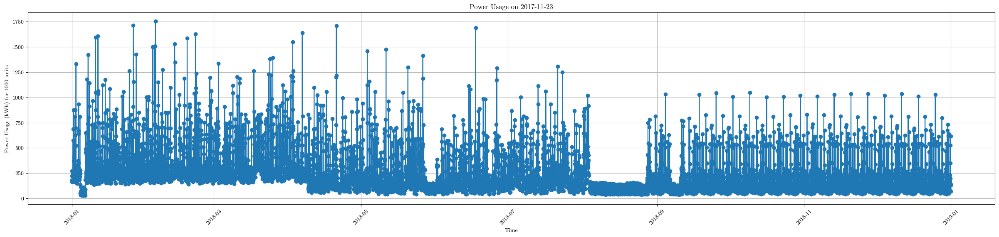

In [4]:

# Load and preprocess household demand data
df = pd.read_csv("demand.csv")
df['Power Change (kWh)'] = df['kWh'].diff().fillna(0)
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
print(df.head())

# Convert UTC timestamp to datetime and select a random date for plotting
df['UTC'] = pd.to_datetime(df['UTC'])
df['Date'] = df['UTC'].dt.date
random_date = np.random.choice(df['Date'].unique())
day_data = df[df['Date'] == random_date]


# Assuming 'UTC time' is the column with your dates
start_date = df['UTC'].min()
end_date = df['UTC'].max()

print(f"Starting date: {start_date}")
print(f"Ending date: {end_date}")


# Filter the DataFrame for the specified date range
filtered_df = df[(df['UTC'] >= '2018-01-01') & (df['UTC'] <= '2019-01-01')]


def adjust_kwh(units):
    # Multiply the 'kWh' column by the number of units
    adjusted_values = filtered_df['Power Change (kWh)'] * units
    
    # Add a 3% random error to each value
    # The random error is generated as 3% of the adjusted value multiplied by a random number between -1 and 1
    random_error = adjusted_values * 0.03 * np.random.uniform(-1, 1, size=adjusted_values.shape)
    
    # Apply the random error to the adjusted values
    final_values = adjusted_values + random_error
    
    # Return the final values as a NumPy array
    return final_values.to_numpy()

result_array = adjust_kwh(1000)

# Display the result
print(result_array)



# Plotting
plt.figure(figsize=(30, 6))
plt.plot(filtered_df['UTC'], result_array, marker='o', linestyle='-')
plt.title(f'Power Usage on {random_date}')
plt.xlabel('Time')
plt.ylabel('Power Usage (kWh) for 1000 units')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

## Prices

In [5]:
# Load the CSV file
file_path = "15minprices.csv"
df_prices = pd.read_csv(file_path)
# Set the font family to Times New Roman


df_prices['Day-ahead Price [EUR/MWh]'].fillna(method='ffill', inplace=True)
df_prices['MTU (CET/CEST)'].str.split('-').str[0].str.strip()
df_prices['Timestamp'] = pd.to_datetime(df_prices['MTU (CET/CEST)'].str.split('-').str[0].str.strip(), format="%d.%m.%Y %H:%M")

# Set the datetime as the index
df_prices.set_index('Timestamp', inplace=True)

# Resample to hourly intervals and calculate the mean
df_prices = df_prices['Day-ahead Price [EUR/MWh]'].resample('H').mean().reset_index()

# Resulting DataFrame has hourly intervals with the average price
print(df_prices.shape)

df_prices.head()




C:\Users\Sarang Sujit\AppData\Local\Temp\ipykernel_23592\1231940455.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_prices['Day-ahead Price [EUR/MWh]'].fillna(method='ffill', inplace=True)


(8760, 2)


,Timestamp,Day-ahead Price [EUR/MWh]
0,2019-01-01 00:00:00,20.0025
1,2019-01-01 01:00:00,13.5400
2,2019-01-01 02:00:00,5.5925
3,2019-01-01 03:00:00,3.2000
4,2019-01-01 04:00:00,3.8975


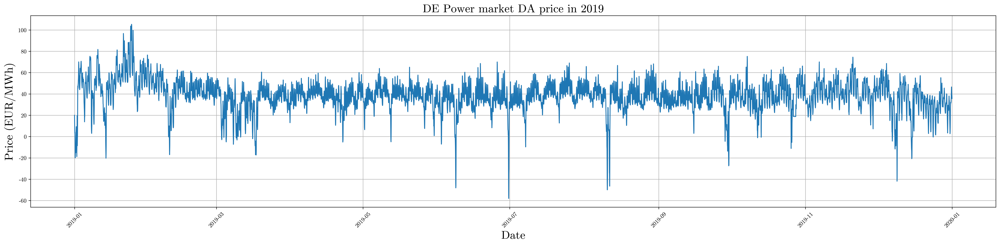

In [6]:

# Plotting
plt.figure(figsize=(30, 6),dpi=300)
plt.plot(df_prices['Timestamp'] ,df_prices['Day-ahead Price [EUR/MWh]'], marker='', linestyle='-')
plt.title(f'DE Power market DA price in 2019',fontsize=20)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Price (EUR/MWh)', fontsize=20)
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig("pricechart.png")
plt.show()

## Solar

In [7]:
df_solar = pd.read_csv("solar.csv")
df_solar.head()

,time,local_time,electricity
0,1/1/2019 0:00,1/1/2019 1:00,0.0
1,1/1/2019 1:00,1/1/2019 2:00,0.0
2,1/1/2019 2:00,1/1/2019 3:00,0.0
3,1/1/2019 3:00,1/1/2019 4:00,0.0
4,1/1/2019 4:00,1/1/2019 5:00,0.0


# Final parameters

In [8]:
df_prices

,Timestamp,Day-ahead Price [EUR/MWh]
0,2019-01-01 00:00:00,20.0025
1,2019-01-01 01:00:00,13.5400
2,2019-01-01 02:00:00,5.5925
3,2019-01-01 03:00:00,3.2000
4,2019-01-01 04:00:00,3.8975
...,...,...
8755,2019-12-31 19:00:00,43.1625
8756,2019-12-31 20:00:00,40.5000
8757,2019-12-31 21:00:00,38.5000
8758,2019-12-31 22:00:00,38.5975


In [9]:
df_demand = filtered_df
df_demand.head()

,UTC,DE TIME,kWh,0.045,Power Change (kWh),Date
19141,2018-01-01 00:00:00+00:00,2018-01-01T01:00:00+0100,5975.186,5975.412,0.265,2018-01-01
19142,2018-01-01 01:00:00+00:00,2018-01-01T02:00:00+0100,5975.412,5975.591,0.226,2018-01-01
19143,2018-01-01 02:00:00+00:00,2018-01-01T03:00:00+0100,5975.591,5975.752,0.179,2018-01-01
19144,2018-01-01 03:00:00+00:00,2018-01-01T04:00:00+0100,5975.752,5975.981,0.161,2018-01-01
19145,2018-01-01 04:00:00+00:00,2018-01-01T05:00:00+0100,5975.981,5976.211,0.229,2018-01-01


In [10]:
N = 456
np.sum(np.array(df_demand["Power Change (kWh)"][N:N+24]))

7.578000000000429

In [11]:
df_solar.head()

,time,local_time,electricity
0,1/1/2019 0:00,1/1/2019 1:00,0.0
1,1/1/2019 1:00,1/1/2019 2:00,0.0
2,1/1/2019 2:00,1/1/2019 3:00,0.0
3,1/1/2019 3:00,1/1/2019 4:00,0.0
4,1/1/2019 4:00,1/1/2019 5:00,0.0


In [12]:
len(df_demand)

8761

# Running the RH Algorithm

In [13]:
from gurobipy import Model, GRB, quicksum
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

## Deterministic optimisation function

In [14]:
def det_optimisation(inter_mg_limit, spread, charge_limit, trade_cost, demand_subset, PVgen_subset, price_subset,
                        num_periods, currentSOC,max_capacity, outputflag):

    demand = demand_subset
    PVgen = PVgen_subset
    main_grid_prices = price_subset

    #env = gp.Env(params=params)

    # Create the model within the Gurobi environment
    model = gp.Model(env=env)

    model.setParam('OutputFlag', outputflag)
    model.setParam('Threads', 8)

    


    #Energy purchased from the main grid for each MG in each time period
    Emb = model.addVars(num_consumers, num_periods, name="EM_{i,b}^t", lb=0, vtype=GRB.CONTINUOUS)

    #Energy sold to the main grid for each MG in each time period
    Ems = model.addVars(num_consumers, num_periods, name="EM_{i,s}^t", lb=0, vtype=GRB.CONTINUOUS)

    #BESS energy stored for each MG iat the end of each time period
    SOC = model.addVars(num_consumers, num_periods, name="EB_{i} ^t", vtype=GRB.CONTINUOUS)


    #Binary variable deciding if BESS is charged for each MG in each time period
    Yc = model.addVars(num_consumers, num_periods, name="Y_{i,C} ^t", vtype=GRB.BINARY)

    #Binary variable deciding if BESS is discharged for each MG in each time period
    Yd = model.addVars(num_consumers, num_periods, name="Y_{i,D} ^t", vtype=GRB.BINARY)


    #Energy retrieved from battery for each MG in each time period
    Ebc = model.addVars(num_consumers, num_periods, name="EB_{i,C} ^t", lb=0, vtype=GRB.CONTINUOUS)
    Ebd = model.addVars(num_consumers, num_periods, name="EB_{i,D} ^t", lb=0, vtype=GRB.CONTINUOUS)


    #Energy retrieved from battery for each MG in each time period
    Emg = model.addVars(num_consumers, num_consumers, num_periods, name="Emg",lb=-2.75e8, vtype=GRB.CONTINUOUS)
    EMGi = model.addVars(num_consumers,num_periods, lb=-2.75e8, name="EMGi", vtype=GRB.CONTINUOUS)

    #Cost of MG at time t
    C = model.addVars(num_consumers, num_periods, name="C", lb=-1e12, vtype=GRB.CONTINUOUS)

    #CONSTRAINTS


    #Basic demand constraint
    for i in range(num_consumers):
        for t in range(num_periods):
            model.addConstr( 0 <= - demand[i, t]+  Emb[i, t] - Ems[i,t] + PVgen[i, t] + Ebd[i, t] - Ebc[i,t]  + EMGi[i,t])
    for i in range(num_consumers):
        #BESS constraint, SOC at end must be more than or equal to initial SOC
        model.addConstr(SOC[i, num_periods-1] >= currentSOC[i] )
        for t in range(1, num_periods):
        #GENERAL BESS UPDATING EQUATION
            model.addConstr(SOC[i, t] == SOC[i, t-1] + (eta*Ebc[i,t] - (1/eta)*Ebd[i,t]))

   
    for i in range(num_consumers):
        #INITIAL BESS UPDATING EQUATION
        
        model.addConstr(SOC[i, 0] == currentSOC[i] + (eta*Ebc[i,0] - (1/eta)*Ebd[i,0]), name=f"BS1_{i}")
        for t in range(num_periods):
            #Charge/discharge limit
            #model.addConstr( 0 >= - (Yd[i,t]*charge_limit*SOCinitial[i]) + Eb[i, t])
            model.addConstr(charge_limit*max_capacity[i]*Yc[i,t] >=  Ebc[i, t])
            model.addConstr(charge_limit*max_capacity[i]*Yd[i,t] >=  Ebd[i, t])
            model.addConstr(Yc[i,t] + Yd[i,t] == 1)
            #Minimum SOC level is 10% of initial
            model.addConstr(SOC[i, t] >= 0.1*max_capacity[i] )
            model.addConstr(SOC[i, t] <= 1.0*max_capacity[i] )

    # Energy trading between MG
    for i in range(num_consumers):
        for j in range(num_consumers):
            for t in range(0, num_periods):
                #energy traded from i to j is net energy, so is negative of j to i
                model.addConstr(Emg[i,j,t] == -Emg[j,i,t])
                #energy traded from i to i is 0
                model.addConstr(Emg[i,i,t] == 0)
                #energy traded from i to j is constrained by max value
                model.addConstr(Emg[i,j,t] <= inter_mg_limit, name=f"inter_{i}_{j}_{t}")
                model.addConstr(Emg[i,j,t] >= -inter_mg_limit)

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(EMGi[i,t] == quicksum(Emg[i,j,t] for j in range(num_consumers) ))

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(Ems[i,t] <= demand[i,t]*1)

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(Emb[i,t] <= demand[i,t]*2)

    if trade_cost is True:
        #Cost of operation of MG:
        for i in range(num_consumers):
            for t in range(num_periods):
                    model.addConstr(C[i,t] == Emb[i, t] * (1.00 + spread) *main_grid_prices[t] - Ems[i, t] * (1-spread) *main_grid_prices[t] +
                                     EMGi[i,t] * main_grid_prices[t] , name=f"bruh{i}{t}")
    else:
         #Cost of operation of MG:
        for i in range(num_consumers):
            for t in range(num_periods):
                    model.addConstr(C[i,t] == Emb[i, t] * (1.00 + spread) *main_grid_prices[t] - Ems[i, t] * (1-spread) *main_grid_prices[t]  , name=f"bruh{i}{t}")

    a = np.array([1,1,1,1])
    obj = quicksum(a[i]*C[i,t] for i in range(num_consumers) for t in range(num_periods))

    # Set the objective
    model.setObjective(obj, GRB.MINIMIZE)

    # Solve the model
    model.optimize()

    con = model.getConstrByName('inter_1_0_0')




    total_sold = sum(Ems[i,t].X for i in range(num_consumers) for t in range(num_periods))
    # print(total_sold)

    total_battery = [ sum(Ebc[i,t].X for i in range(num_consumers)) for t in range(num_periods)]
    total_cost = sum(C[i,t].X for i in range(num_consumers) for t in range(num_periods))
    current_cost = sum(C[i,0].X for i in range(num_consumers))
    current_SOC = [[SOC[i,j].X for i in range(num_consumers)] for j in range(num_periods)]
    cost_list = [[C[i,j].X for i in range(num_consumers)] for j in range(num_periods)]
    #print(total_sold)
    return total_sold, total_cost, total_battery, current_cost, current_SOC, cost_list, model


## Converting dataframes into parameter sets

### Deciding on the number of consumers and number of periods/hours (length of parameter set)

In [15]:
num_consumers = 3
num_periods = 8760

### Deciding on the number of houses/units in each MG

In [16]:
# Number of houses/units in each of the three microgrids
number_of_homes = np.array([200, 600, 1900])


### Creating demand parameter set

In [17]:
# Convert sets to float to avoid type casting issues
demand_set = np.array(df_demand["Power Change (kWh)"].astype(float))
demand_values = demand_set/1000
demand_list = demand_values * number_of_homes[:, np.newaxis]
demand_list.shape


(3, 8761)

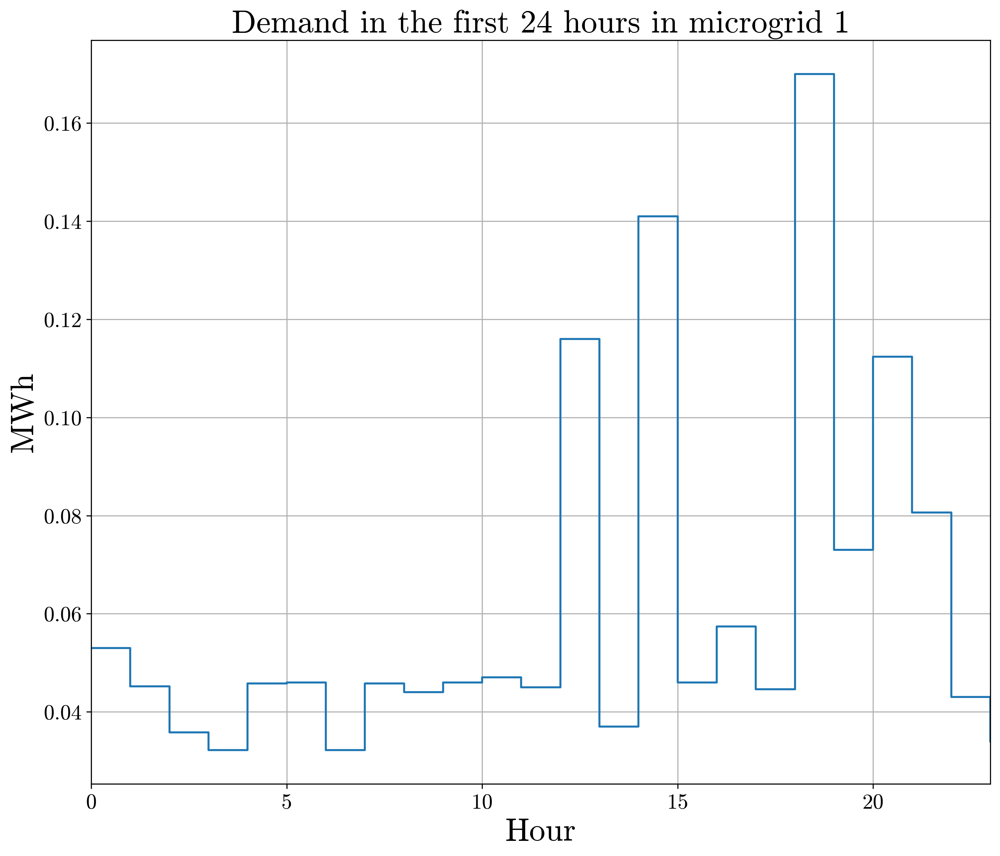

In [18]:
# Plotting the array
plt.figure(figsize=(12,10), dpi=300)
plt.plot(demand_list[0,:24], marker=' ', drawstyle="steps-post")  # 'o' creates a circle marker at each data point
plt.title('Demand in the first 24 hours in microgrid 1', fontsize=24)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.tick_params(axis='both', which='minor', labelsize=16)
plt.xlabel('Hour' , fontsize=24)
plt.xlim([0,23])
plt.ylabel('MWh' , fontsize=24)
plt.grid(True)  # Adds a grid for easier visualization
plt.savefig("demand_example.png")
plt.show()

### Creating PV production parameter set

In [19]:
# Average solar panel capacity per house in each microgrid in kW
PVavg = {1: 1.2, 2: 0.9, 3: 1.5}
solar_irradiance_values = np.array(df_solar.electricity.astype(float))

# Initialize the PV generation array
PV_list = np.zeros((num_consumers, num_periods))

# Calculate PV generation for each consumer and time period
for i in range(num_consumers):
    for t in range(num_periods):
        PV_list[i, t] = solar_irradiance_values[t] * PVavg[i+1] * number_of_homes[i]/1000  # i+1 because dictionary keys start at 1
        
# PVgen is now populated with the PV generation values in MWh for each consumer and time period
PV_list[1,]

len(PV_list[1,])

8760

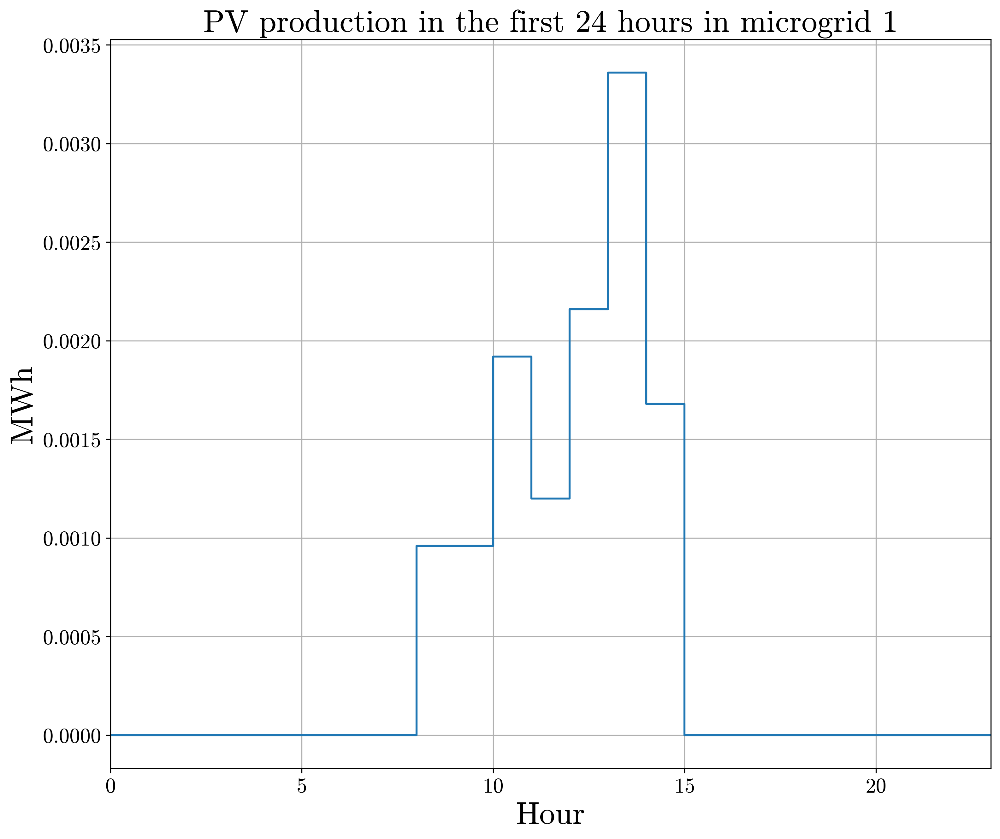

In [20]:
# Plotting the array
plt.figure(figsize=(12,10), dpi=300)
plt.plot(PV_list[0,:24], marker=' ', drawstyle="steps-post")  # 'o' creates a circle marker at each data point
plt.title('PV production in the first 24 hours in microgrid 1', fontsize=24)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.tick_params(axis='both', which='minor', labelsize=16)
plt.xlabel('Hour' , fontsize=24)
plt.xlim([0,23])
plt.savefig("PV_example.png")
plt.ylabel('MWh' , fontsize=24)
plt.grid(True)  # Adds a grid for easier visualization
plt.show()

# Forecast error and uncertainty


## Proving the relation between RMSE and Laplace variacne

In [21]:

def generate_laplace_samples(mu, b, size):
    """
    Generate samples from a Laplacian distribution using NumPy.

    Parameters:
    - mu (float): the location parameter (mean) of the distribution.
    - b (float): the diversity parameter (scale), b > 0.
    - size (int): the number of samples to generate.

    Returns:
    - np.ndarray: array of samples from the Laplacian distribution.
    """
    samples = np.random.laplace(mu, b, size)
    return samples
def calculate_rmse(samples, population_mean):
    """
    Calculate the root mean square error (RMSE) between the samples and the population mean.

    Parameters:
    - samples (np.ndarray): array of samples.
    - population_mean (float): the population mean to compare against.

    Returns:
    - float: the RMSE value.
    """
    mse = np.mean((samples - population_mean)**2)
    rmse = np.sqrt(mse)
    return rmse
    
# Parameters
mu = 50  # Location parameter of the Laplacian distribution
b =  3  # Scale parameter of the Laplacian distribution
size = 1000000 # Number of samples

# Generate samples
samples = generate_laplace_samples(mu, b, size)


rmse = calculate_rmse(samples, mu)
print(f"Real Root Mean Square Error (RMSE): {rmse}")
print(f"Expected Root Mean Square Error (RMSE): {np.sqrt((2*b**2))}")

Real Root Mean Square Error (RMSE): 4.251417999938081
Expected Root Mean Square Error (RMSE): 4.242640687119285


In [22]:
# Parameters
mu = 50  # Location parameter of the Laplacian distribution

rmsep = 0.50
b = (rmsep*mu)/np.sqrt(2) # Scale parameter of the Laplacian distribution
size = 1000000 # Number of samples

# Generate samples
samples = generate_laplace_samples(mu, b, size)

#rmse = sqrt(2b^2)
#rmse/mean = rmse % = sqrt(2b^2)/mu
#sqrt((rmse% * mu)/sqrt(2))
# Calculate RMSE
rmse = calculate_rmse(samples, mu)
print(f"Root Mean Square Error (RMSE): {rmse}")
print(f"Expected Root Mean Square Error (RMSE): {np.sqrt((2*b**2))}")

Root Mean Square Error (RMSE): 24.983914966186752
Expected Root Mean Square Error (RMSE): 24.999999999999996


## Forecast error function defintions

In [23]:


def add_solar_errors(true_values, uncertainty=np.array([0.10,0.20,0.30,0.35,0.35,0.35,0.40,0.40])):
    """
    Adds artificial residual errors of a laplacian distribution to true prediction values of solar generation.
    
    Parameters:
    - true_values: A list of true prediction values.
    - error_list: A list of nRMSE  taken from forecasting model performances
    
    Returns:
    - A list of new predicted values with artificial residuals added.
    """
    # Initialize an empty list to store the new predicted values
    new_predictions = []

    #Make them into python arrays
    true_values = np.array(true_values)

    min_length = min(len(uncertainty), len(true_values))

    # Trim the arrays to the length of the shorter array
    uncertainty = uncertainty[:min_length]
    true_values = true_values[:min_length]

    
    # Iterate over the true values and their indices
    for index, true_value in enumerate(true_values):

        #The true value serves as the distribution mean, around which a residual is created.
        mu = true_value

        #RMSE(%) is converted to parameter b using the below formula
        b = (uncertainty[index]*mu)/np.sqrt(2) 
         
        
        # Add the residual error to the true value
        new_prediction = np.random.laplace(mu,b)
        
        # Append the new prediction to the list
        new_predictions.append(new_prediction)
    
    return new_predictions


# Example usage
true_values = [0, 200, 300, 400, 500]

new_predictions = add_solar_errors(true_values)
print(new_predictions)


[0.0, 184.41997692388762, 357.3637965923791, 242.7375123008922, 549.6820812499798]


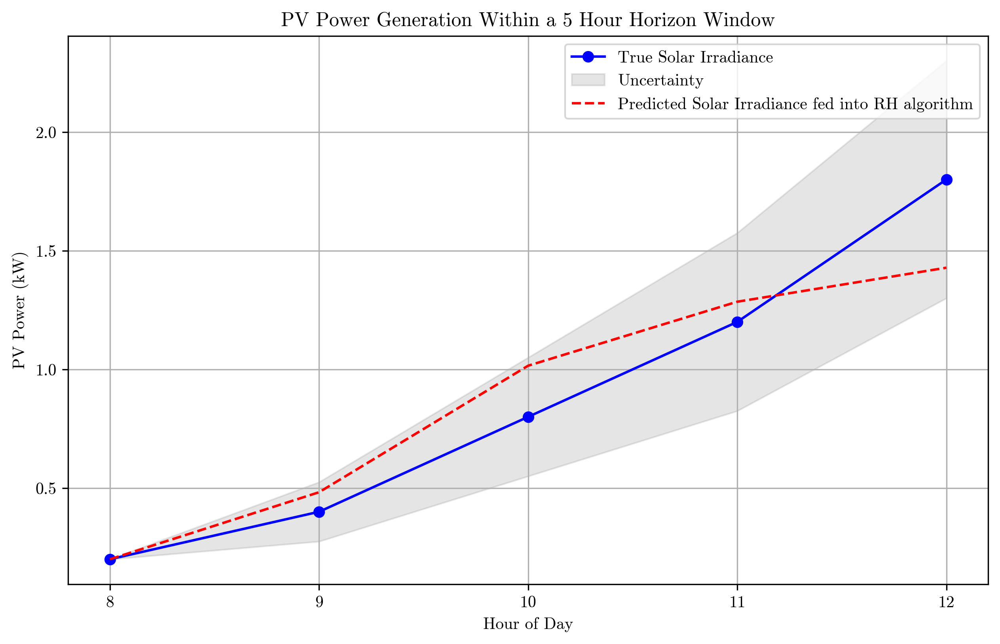

In [24]:
import numpy as np
import matplotlib.pyplot as plt

def add_solar_errors(true_values, uncertainty):
    """
    Adds artificial residual errors of a laplacian distribution to true prediction values of solar generation.
    
    Parameters:
    - true_values: A list of true prediction values.
    - uncertainty: A list of uncertainties expressed as standard deviations.
    
    Returns:
    - A list of new predicted values with artificial residuals added.
    """
    lower_bound = [s - sd for s, sd in zip(true_values, uncertainty)]
    upper_bound = [s + sd for s, sd in zip(true_values, uncertainty)]
    new_predictions = [np.random.uniform(low, high) for low, high in zip(lower_bound, upper_bound)]
    
    return new_predictions, lower_bound, upper_bound

# Example usage
true_values = [0.2, 0.4, 0.8, 1.2, 1.8]
hours = [8, 9, 10, 11, 12]
std_dev = np.linspace(0.0, 0.5, len(true_values))  # Increasing uncertainty

# Get predictions and bounds
new_predictions, lower_bound, upper_bound = add_solar_errors(true_values, std_dev)

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(hours, true_values, '-o', label='True Solar Irradiance', color='blue')
plt.fill_between(hours, lower_bound, upper_bound, color='gray', alpha=0.2, label='Uncertainty')
plt.plot(hours, new_predictions, '--', label='Predicted Solar Irradiance fed into RH algorithm', color='red')

plt.title('PV Power Generation Within a 5 Hour Horizon Window')
plt.xlabel('Hour of Day')
plt.ylabel('PV Power (kW)')
plt.legend()
plt.grid(True)
plt.xticks(hours)
plt.savefig("solar_error.png")
plt.show()


## Fitting real-forecast error to function

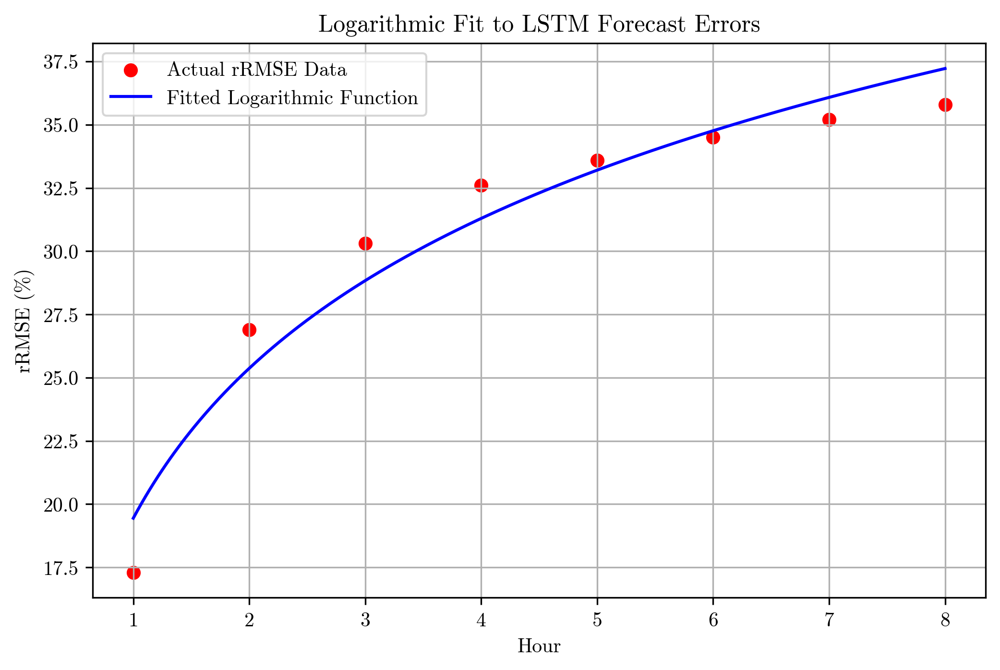

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# LSTM data for each hour
hours = np.array([ 1, 2, 3, 4, 5, 6, 7, 8])  # Hours
errors = np.array([17.3, 26.9, 30.3, 32.6, 33.6, 34.5, 35.2, 35.8])  # rRMSE (%)

# Define the model function
def log_func(x, a, b):
    return a + b * np.log(x)

# Fit the curve
popt, pcov = curve_fit(log_func, hours, errors)


# Values for plotting the fitted curve
x_values = np.linspace(1, 8, 400)
y_values = log_func(x_values, *popt)

# Plotting the results
plt.figure(figsize=(8, 5),dpi=300)
plt.scatter(hours, errors, color='red', label='Actual rRMSE Data')
plt.plot(x_values, y_values, label='Fitted Logarithmic Function', color='blue')
plt.title('Logarithmic Fit to LSTM Forecast Errors')
plt.xlabel('Hour')
plt.ylabel('rRMSE (%)')
plt.legend()
plt.grid(True)
plt.savefig("fitted_solar.png")
plt.show()



In [26]:
popt

array([19.44463184,  8.54750961])

In [27]:


def PV_forecasting(n):
    """
    Calculate the RMSE uncertainty based on the index n using the given logarithmic formula.
    
    Parameters:
    - n: Index (hour), must be greater than 0 to avoid log(0) error.
    
    Returns:
    - RMSE uncertainty as a float.
    """
    if n > 0: #19.44
        return (19.44+ 8.66 * np.log(n))*0.01
    else:
        return 0 
def add_solar_errors(true_values):
    """
    Adds artificial residual errors of a laplacian distribution to true prediction values of solar generation based on
    dynamically calculated RMSE uncertainty.
    
    Parameters:
    - true_values: A list of true prediction values.
    
    Returns:
    - A list of new predicted values with artificial residuals added.
    """
    new_predictions = []
    true_values = np.array(true_values)
    
    # Iterate over the true values and their indices (1-based for log calculation)
    for index, true_value in enumerate(true_values, start=0):
       
        # Calculate uncertainty using the rmse_uncertainty function
        uncertainty = PV_forecasting(index)
        
        # The true value serves as the distribution mean, around which a residual is created.
        mu = true_value

        # RMSE(%) is converted to parameter b using the below formula
        b = (uncertainty * mu) / np.sqrt(2)
        
        # Add the residual error to the true value
        new_prediction = np.random.laplace(mu, b)
        
        # Append the new prediction to the list
        new_predictions.append(new_prediction)
    
    return new_predictions

# Example usage
np.random.seed(42)
true_values = [100, 200, 300, 400, 500]
new_predictions = add_solar_errors(true_values)
print(new_predictions)


[100.0, 263.69897818172444, 333.65687189029023, 417.99997268131193, 370.52085551805726]


In [28]:

def load_uncertainty(n):
    """
    Calculate the RMSE uncertainty for load forecasting based on the index n using the given logarithmic formula.
    
    Parameters:
    - n: Index (hour), must be greater than 0 to avoid log(0) error.
    
    Returns:
    - RMSE uncertainty as a float.
    """
    if n > 0:
        return ( (-0.0064)*n**4 + (0.2206)*n**3 - 2.6425*n**2 + 12.532*n + 6.6847)*0.01
    else:
        return 0 # Return the base value for n=1 since log(1) = 0 and it's the smallest possible n in log scale

def add_load_errors(true_values):
    """
    Adds artificial residual errors of a normal distribution to true prediction values of future load based on
    dynamically calculated RMSE uncertainty.
    
    Parameters:
    - true_values: A list of true prediction values.
    
    Returns:
    - A list of new predicted values with artificial residuals added.
    """
    new_predictions = []
    true_values = np.array(true_values)
    
    # Iterate over the true values and their indices (1-based for log calculation)
    for index, true_value in enumerate(true_values, start=0):
        
        # Calculate uncertainty using the rmse_uncertainty function
        uncertainty = load_uncertainty(index)

    
        # The true value serves as the distribution mean, around which a residual is created.
        mu = true_value

        # RMSE(%) is converted to parameter b using the below formula
        b = (uncertainty * mu) 
        
        # Add the residual error to the true value
        new_prediction = np.random.normal(mu, b)
        
        # Append the new prediction to the list
        new_predictions.append(new_prediction)
    
    return new_predictions

# Example usage
np.random.seed(42)
true_values = [100, 200, 300, 400, 500]
new_predictions = add_load_errors(true_values)
print(new_predictions)


[100.0, 195.35752721243537, 344.3817560028352, 558.0052094231942, 468.3744256730547]


In [29]:
import time
start_time = time.time()

# Constants
NUM_CONSUMERS = 3
SIMULATION_DURATION = 24*7
HORIZON_LENGTH = 3 # Planning horizon length in hours
INTER_MICROGRID_LIMIT = 0.1  # Inter-microgrid trading limit
PRICE_SPREAD = 0.05  # Price spread for trades
CHARGING_LIMIT = 0.1 # Battery charging limit
TRADE_COST_ENABLED = True  # Flag for enabling trade costs
UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
CHARGING_EFFICIENCY = 0.95  # Charging efficiency
eta=CHARGING_EFFICIENCY

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
# price_set = np.where(price_set < 0, 5, price_set)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1

print("Initial SOC:", current_SOC)
print("Max capacity:", max_capacity)



# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

average_rolling_horizon_cost = []
for iter in range(2):
    # Simulation loop
    # Initialize simulation variables
    total_rolling_horizon_cost = 0
    print(iter)
    rolling_horizon_costs = []
    for hour in range(SIMULATION_DURATION):

        
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        
        SEED = (hour + iter)**3  # Seed for random number generator
        # Initialize random seed
        np.random.seed(SEED)
    
        horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

        
        demand_subset = demand_set[:, hour:horizon_end]
        
        if iter > 0:
            demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
            demand_subset = np.clip(demand_subset, 0, None)
        
    
        PV_generation_subset = PV_generation_set[:, hour:horizon_end]

        if iter > 0:
            PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
            PV_generation_subset = np.clip(PV_generation_subset, 0, None)
        
        
        
        price_subset = price_set[hour:horizon_end]
        
        try:
            total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
            )
            
            current_SOC = updated_SOC[0]  # Update SOC for the next iteration
         
        except Exception as e:
            print(current_SOC)
            print(hour)
            print(iter)
            print(PV_generation_subset)
            print(demand_subset)
            print(price_subset)
            print(f"Optimization failed at hour {hour}: {e}")
            total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
            )
            
        
            
        
        # Update costs and SOC for the next iteration
        rolling_horizon_costs.append(current_cost)
        total_rolling_horizon_cost += current_cost

    print(total_rolling_horizon_cost)
    average_rolling_horizon_cost.append(total_rolling_horizon_cost)


#total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1


# Final aggregation and analysis
final_demand_subset = demand_set[:, :SIMULATION_DURATION]
final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
final_price_subset = price_set[:SIMULATION_DURATION]

total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
)

print(f"Total rolling horizon cost: {total_rolling_horizon_cost}")
print(f"Deterministic cost: {total_cost}")


# Calculate and print the cost comparison
print(f"Printing determinstic/RH cost ratio: {(total_cost/total_rolling_horizon_cost)}")
print(F"Price difference between determinsitic and RH cost: {total_rolling_horizon_cost - total_cost}")


total_deterministic_costs = [sum(sublist) for sublist in cost_list]



# Your code here
elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time} seconds")



Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0


5179.757610599841
1
5175.074612613261
Total rolling horizon cost: 5175.074612613261
Deterministic cost: 4041.935898928162
Printing determinstic/RH cost ratio: 0.7810391543102995
Price difference between determinsitic and RH cost: 1133.138713685099
Elapsed time: 4.771707773208618 seconds


In [30]:
average_rolling_horizon_cost

[5179.757610599841, 5175.074612613261]

In [31]:
import time
start_time = time.time()

# Constants
NUM_CONSUMERS = 3
SIMULATION_DURATION = 24*8
HORIZON_LENGTH = 3 # Planning horizon length in hours
INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
PRICE_SPREAD = 0.05  # Price spread for trades
CHARGING_LIMIT = 1 # Battery charging limit
TRADE_COST_ENABLED = True  # Flag for enabling trade costs
UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
CHARGING_EFFICIENCY = 0.95  # Charging efficiency
eta=CHARGING_EFFICIENCY

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
# price_set = np.where(price_set < 0, 5, price_set)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1

print("Initial SOC:", current_SOC)
print("Max capacity:", max_capacity)



# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

average_rolling_horizon_cost = []
for iter in range(3):
    # Simulation loop
    # Initialize simulation variables
    total_rolling_horizon_cost = 0
    print(iter)
    rolling_horizon_costs = []
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    for hour in range(SIMULATION_DURATION):
        
        SEED = (hour * iter)**2  # Seed for random number generator
        # Initialize random seed
        np.random.seed(SEED)
    
        horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)

        
        demand_subset = demand_set[:, hour:horizon_end]
        
        if iter > 0:
            demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
            demand_subset = np.clip(demand_subset, 0, None)
        
    
        PV_generation_subset = PV_generation_set[:, hour:horizon_end]

        if iter > 0:
            PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
            PV_generation_subset = np.clip(PV_generation_subset, 0, None)
        
        
        
        price_subset = price_set[hour:horizon_end]
        
        try:
            total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
            )
            
            current_SOC = updated_SOC[0]  # Update SOC for the next iteration
         
        except Exception as e:
            print(current_SOC)
            print(hour)
            print(iter)
            print(PV_generation_subset)
            print(demand_subset)
            print(price_subset)
            print(f"Optimization failed at hour {hour}: {e}")
            total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
            )
            
        
            
        
        # Update costs and SOC for the next iteration
        rolling_horizon_costs.append(current_cost)
        total_rolling_horizon_cost += current_cost

    print(total_rolling_horizon_cost)
    average_rolling_horizon_cost.append(total_rolling_horizon_cost)


#total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

# Data initialization
price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
# Convert arrays to float to avoid typecasting issues later
demand_set = demand_list.astype(float)
PV_generation_set = PV_list.astype(float)

# Initialize State of Charge (SOC)
max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
current_SOC = max_capacity*0.1


# Final aggregation and analysis
final_demand_subset = demand_set[:, :SIMULATION_DURATION]
final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
final_price_subset = price_set[:SIMULATION_DURATION]

total_sold, total_cost, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
    final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
)

print(f"Total rolling horizon cost: {total_rolling_horizon_cost}")
print(f"Deterministic cost: {total_cost}")


# Calculate and print the cost comparison
print(f"Printing determinstic/RH cost ratio: {(total_cost/total_rolling_horizon_cost)}")
print(F"Price difference between determinsitic and RH cost: {total_rolling_horizon_cost - total_cost}")


total_deterministic_costs = [sum(sublist) for sublist in cost_list]



# Your code here
elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time} seconds")



Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0
5072.268925964022
1
5082.475015127042
2
5063.139987024098
Total rolling horizon cost: 5063.139987024098
Deterministic cost: 4513.0878670937145
Printing determinstic/RH cost ratio: 0.8913614631750125
Price difference between determinsitic and RH cost: 550.0521199303839
Elapsed time: 7.74308967590332 seconds


In [32]:
import math
math.pi

3.141592653589793

In [33]:
horizon_list = [2,4,8]

cost_dict = {}
for horizon in horizon_list:

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*7
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
    for iter in range(6):
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter > 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    

    if horizon == 2:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    cost_dict[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  
    


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0
1
2
3


In [ ]:
cost_dict

{2: ([4499.984987496034,
   4504.707863089967,
   4535.7289278819735,
   4468.4103789119235,
   4517.859037813833,
   4525.478007862],
  3921.7019176932504),
 4: ([4272.4131250242035,
   4269.862108715192,
   4318.316344669807,
   4297.83696421346,
   4270.199989224652,
   4307.507732313535],
  3921.7019176932504),
 8: ([4069.7340716153294,
   4097.952321610605,
   4104.31941697133,
   4093.023004373079,
   4106.037799300989,
   4075.4479326718806],
  3921.7019176932504)}

In [ ]:
cost_dict[4][0][1:]

[24075.787372900275, 24151.3920404336]

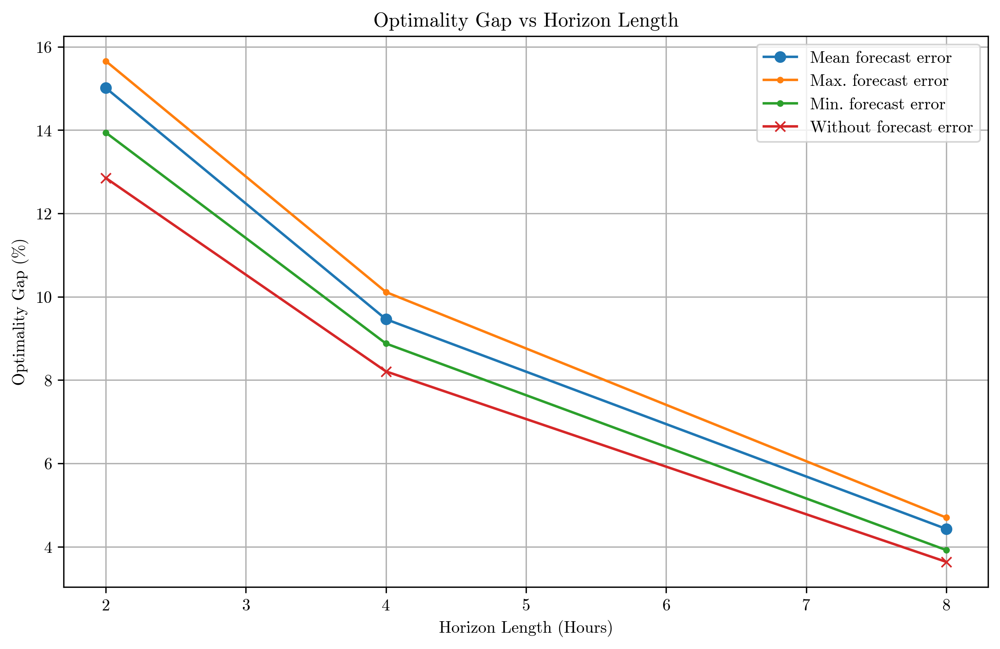

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict.keys())
optimality_gaps_uncertain = [(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_max = [(abs(value[1] - np.max(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_min= [(abs(value[1] - np.min(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]


optimality_gaps = [(1-value[1] /value[0][0] )*100 for value in cost_dict.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length')
plt.grid(True)
plt.savefig("optim_hl_errors.png")
plt.show()

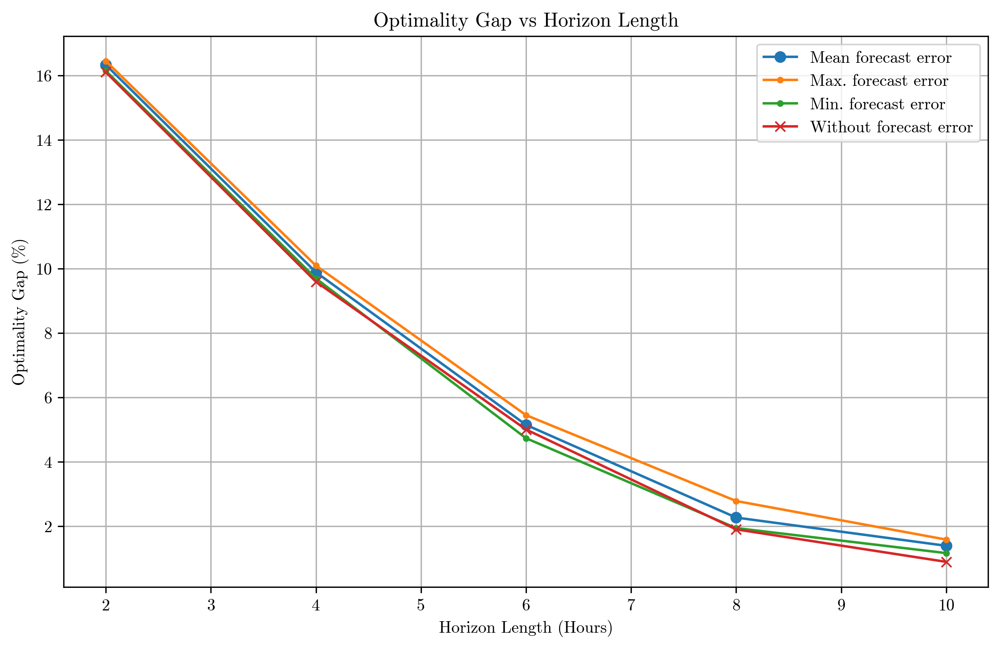

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict.keys())
optimality_gaps_uncertain = [(1-value[1] / np.mean(value[0][1:]) )*100 for value in cost_dict.values()]
optimality_gaps_uncertain_max = [(1-value[1] / np.max(value[0][1:]) )*100 for value in cost_dict.values()]
optimality_gaps_uncertain_min= [(1-value[1] / np.min(value[0][1:]) )*100 for value in cost_dict.values()]


optimality_gaps = [(1-value[1] /value[0][0] )*100 for value in cost_dict.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length')
plt.grid(True)
plt.savefig("optim_hl_errors_1mo.png")
plt.show()

In [ ]:
np.shape(demand_list)

(3, 8761)

In [ ]:
horizon_list = [2,4,6,8,10]

cost_dict = {}



# Your code here



for horizon in horizon_list:
    start_time = time.time()
    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*12
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    start_time = 0
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
    for iter in range(6):
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter > 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1

    

    if horizon == 2:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, start_time:start_time+SIMULATION_DURATION]
        print(final_demand_subset)
        final_PV_generation_subset = PV_generation_set[:, start_time:start_time+SIMULATION_DURATION]
        final_price_subset = price_set[start_time:start_time+SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    elapsed_time = time.time() - start_time
    print(f"Elapsed time: {elapsed_time} seconds")
    cost_dict[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  
    


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0
1
2
3
4
5
[[0.053  0.0452 0.0358 ... 0.125  0.045  0.024 ]
 [0.159  0.1356 0.1074 ... 0.375  0.135  0.072 ]
 [0.5035 0.4294 0.3401 ... 1.1875 0.4275 0.228 ]]
Elapsed time: 1713292130.9226732 seconds
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0
1
2
3
4
5
Elapsed time: 1713292999.3434398 seconds
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0
1
2
3
4
5
Elapsed time: 1713294219.3478303 seconds
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
0
1
2
3


KeyboardInterrupt: 

In [ ]:
cost_dict

{2: ([-422.6107259510523, -467.8511533824471], -2807.30510408121),
 4: ([-1048.1864012263238, -1138.404664587136], -2807.30510408121)}

In [ ]:
cost_dict

{2: ([99684.5083012745,
   100355.2459216995,
   99980.65055072025,
   100342.9911638826,
   100227.7506236203,
   99987.4973667679],
  42989.319216235184),
 4: ([76824.80850087445,
   77082.12901263281,
   77051.70958456885,
   76780.32231695957,
   76762.98053987231,
   77620.78445268172],
  42989.319216235184),
 6: ([58094.275860412745,
   59414.627453974965,
   58953.59712610643,
   59470.20978392722,
   59720.9057986192,
   59404.30175279572],
  42989.319216235184)}

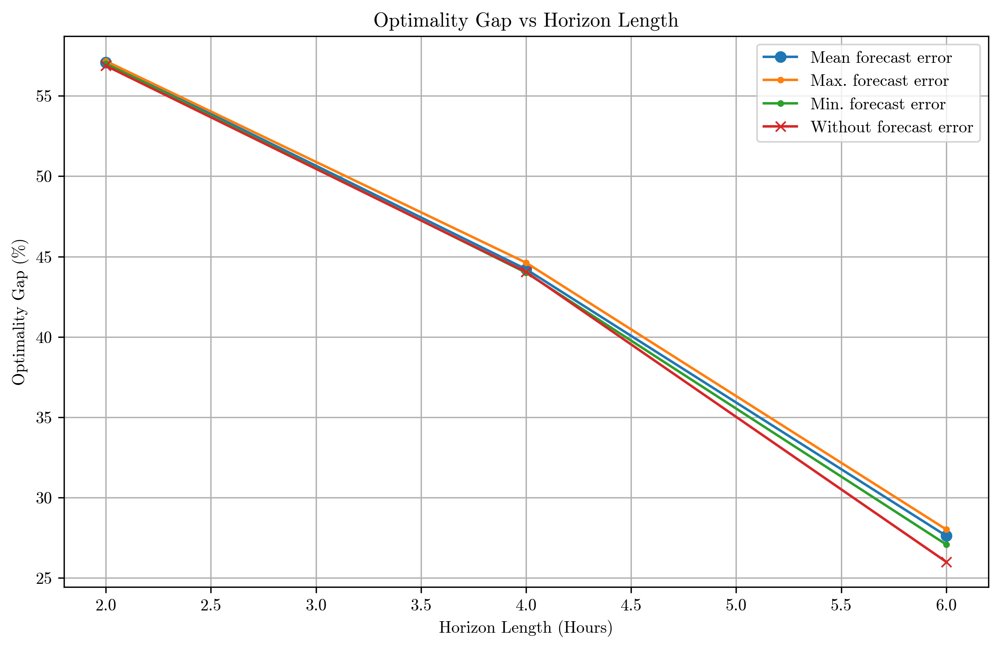

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict.keys())
optimality_gaps_uncertain = [(1-value[1] / np.mean(value[0][1:]) )*100 for value in cost_dict.values()]
optimality_gaps_uncertain_max = [(1-value[1] / np.max(value[0][1:]) )*100 for value in cost_dict.values()]
optimality_gaps_uncertain_min= [(1-value[1] / np.min(value[0][1:]) )*100 for value in cost_dict.values()]


optimality_gaps = [(1-value[1] /value[0][0] )*100 for value in cost_dict.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length')
plt.grid(True)
plt.savefig("optim_hl_errors_12mo.png")
plt.show()

In [ ]:
def det_optimisation(inter_mg_limit, spread, charge_limit, trade_cost, demand_subset, PVgen_subset, price_subset,
                        num_periods, currentSOC,max_capacity, outputflag):

    demand = demand_subset
    PVgen = PVgen_subset
    main_grid_prices = price_subset

    #env = gp.Env(params=params)

    # Create the model within the Gurobi environment
    model = gp.Model(env=env)

    model.setParam('OutputFlag', outputflag)
    model.setParam('Threads', 8)
    model.setParam('MIPFocus', 1)
    model.setParam('Heuristics', 0.1)
    model.setParam('Cuts', 0)



    #Energy purchased from the main grid for each MG in each time period
    Emb = model.addVars(num_consumers, num_periods, name="EM_{i,b}^t", lb=0, vtype=GRB.CONTINUOUS)

    #Energy sold to the main grid for each MG in each time period
    Ems = model.addVars(num_consumers, num_periods, name="EM_{i,s}^t", lb=0, vtype=GRB.CONTINUOUS)

    #BESS energy stored for each MG iat the end of each time period
    SOC = model.addVars(num_consumers, num_periods, name="EB_{i} ^t", vtype=GRB.CONTINUOUS)


    #Binary variable deciding if BESS is charged for each MG in each time period
    Yc = model.addVars(num_consumers, num_periods, name="Y_{i,C} ^t", vtype=GRB.BINARY)

    #Binary variable deciding if BESS is discharged for each MG in each time period
    Yd = model.addVars(num_consumers, num_periods, name="Y_{i,D} ^t", vtype=GRB.BINARY)


    #Energy retrieved from battery for each MG in each time period
    Ebc = model.addVars(num_consumers, num_periods, name="EB_{i,C} ^t", lb=0, vtype=GRB.CONTINUOUS)
    Ebd = model.addVars(num_consumers, num_periods, name="EB_{i,D} ^t", lb=0, vtype=GRB.CONTINUOUS)


    #Energy retrieved from battery for each MG in each time period
    Emg = model.addVars(num_consumers, num_consumers, num_periods, name="Emg",lb=-2.75e8, vtype=GRB.CONTINUOUS)
    EMGi = model.addVars(num_consumers,num_periods, lb=-2.75e8, name="EMGi", vtype=GRB.CONTINUOUS)

    #Cost of MG at time t
    C = model.addVars(num_consumers, num_periods, name="C", lb=-1e12, vtype=GRB.CONTINUOUS)

    #CONSTRAINTS


    #Basic demand constraint
    for i in range(num_consumers):
        for t in range(num_periods):
            model.addConstr( 0 <= - demand[i, t]+  Emb[i, t] - Ems[i,t] + PVgen[i, t] + Ebd[i, t] - Ebc[i,t]  + EMGi[i,t])
    for i in range(num_consumers):
        model.addConstr(SOC[i, num_periods-1] >= currentSOC[i] )
        for t in range(1, num_periods):
        #SOC updating
            model.addConstr(SOC[i, t] == SOC[i, t-1] + (eta*Ebc[i,t] - (1/eta)*Ebd[i,t]))

    # Initial State of Charge
    for i in range(num_consumers):
        model.addConstr(SOC[i, 0] == currentSOC[i] + (eta*Ebc[i,0] - (1/eta)*Ebd[i,0]), name=f"BS1_{i}")
        for t in range(num_periods):
            #Charge/discharge limit
            #model.addConstr( 0 >= - (Yd[i,t]*charge_limit*SOCinitial[i]) + Eb[i, t])
            model.addConstr(charge_limit*max_capacity[i]*Yc[i,t] >=  Ebc[i, t])
            model.addConstr(charge_limit*max_capacity[i]*Yd[i,t] >=  Ebd[i, t])
            model.addConstr(Yc[i,t] + Yd[i,t] == 1)
            #Minimum SOC level is 20% of initial
            model.addConstr(SOC[i, t] >= 0.1*max_capacity[i] )
            model.addConstr(SOC[i, t] <= 1.0*max_capacity[i] )

    # Energy trading between MG
    for i in range(num_consumers):
        for j in range(num_consumers):
            for t in range(0, num_periods):
                #energy traded from i to j is net energy, so is negative of j to i
                model.addConstr(Emg[i,j,t] == -Emg[j,i,t])
                #energy traded from i to i is 0
                model.addConstr(Emg[i,i,t] == 0)
                #energy traded from i to j is constrained by max value
                model.addConstr(Emg[i,j,t] <= inter_mg_limit, name=f"inter_{i}_{j}_{t}")
                model.addConstr(Emg[i,j,t] >= -inter_mg_limit)

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(EMGi[i,t] == quicksum(Emg[i,j,t] for j in range(num_consumers) ))

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(Ems[i,t] <= demand[i,t]*1)

    for i in range(num_consumers):
        for t in range(num_periods):
             model.addConstr(Emb[i,t] <= demand[i,t]*2)

    if trade_cost is True:
        #Cost of operation of MG:
        for i in range(num_consumers):
            for t in range(num_periods):
                    model.addConstr(C[i,t] == Emb[i, t] * (1.00 + spread) *main_grid_prices[t] - Ems[i, t] * (1-spread) *main_grid_prices[t] +
                                     EMGi[i,t] * main_grid_prices[t] , name=f"bruh{i}{t}")
    else:
         #Cost of operation of MG:
        for i in range(num_consumers):
            for t in range(num_periods):
                    model.addConstr(C[i,t] == Emb[i, t] * (1.00 + spread) *main_grid_prices[t] - Ems[i, t] * (1-spread) *main_grid_prices[t]  , name=f"bruh{i}{t}")

    a = np.array([1,1,1,1])
    obj = quicksum(a[i]*C[i,t] for i in range(num_consumers) for t in range(num_periods))

    # Set the objective
    model.setObjective(obj, GRB.MINIMIZE)

    # Solve the model
    model.optimize()

    con = model.getConstrByName('inter_1_0_0')




    total_sold = sum(Ems[i,t].X for i in range(num_consumers) for t in range(num_periods))
    # print(total_sold)

    total_battery = [ sum(Ebc[i,t].X for i in range(num_consumers)) for t in range(num_periods)]
    total_cost = sum(C[i,t].X for i in range(num_consumers) for t in range(num_periods))
    current_cost = sum(C[i,0].X for i in range(num_consumers))
    current_SOC = [[SOC[i,j].X for i in range(num_consumers)] for j in range(num_periods)]
    cost_list = [[C[i,j].X for i in range(num_consumers)] for j in range(num_periods)]
    #print(total_sold)
    return total_sold, total_cost, total_battery, current_cost, current_SOC, cost_list, model


In [ ]:
horizon_list = [8]

cost_dict = {}



# Your code here



for horizon in horizon_list:
    st = time.time()
    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 50
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    start_time = 0
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
   
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1

    

    if horizon >0:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, start_time:start_time+SIMULATION_DURATION]
        #print(final_demand_subset)
        final_PV_generation_subset = PV_generation_set[:, start_time:start_time+SIMULATION_DURATION]
        final_price_subset = price_set[start_time:start_time+SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=1
        )
        print(f"COST: {total_cost_det}")
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    elapsed_time = time.time() - st
    print(f"Elapsed time: {elapsed_time} seconds")
    cost_dict[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  
    


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
Set parameter Threads to value 8
Set parameter MIPFocus to value 1
Set parameter Heuristics to value 0.1
Set parameter Cuts to value 0
Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (win64 - Windows 10.0 (19045.2))

CPU model: AMD Ryzen 7 3700U with Radeon Vega Mobile Gfx, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Academic license 2440162 - for non-commercial use only - registered to sa___@ucl.ac.uk
Optimize a model with 3453 rows, 1800 columns and 6150 nonzeros
Model fingerprint: 0x02fb1633
Variable types: 1500 continuous, 300 integer (300 binary)
Coefficient statistics:
  Matrix range     [5e-01, 7e+01]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+12]
  RHS range        [8e-03, 5e+00]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2862 rows and 873 col

In [ ]:
#COST: 45871.10257666792
#Elapsed time: 16.05063486099243 seconds

In [ ]:
import math

# Experiment 1: 3 month effect of horizon length

In [ ]:
horizon_list = [2,4,8,12]

cost_dict = {}
for horizon in horizon_list:

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*3
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    Sn = 5
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
    for iter in range(Sn+1):
        print(f"iter {iter}")
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter > 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print(average_rolling_horizon_cost)
    if horizon == 2:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    cost_dict[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[58231.04710665239, 58499.47979794263, 58448.88801733623, 58687.890267635245, 58518.72128420261, 58517.051072203045]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[51472.47391902728, 51569.0232360076, 51596.4771969684, 51600.15575573369, 51407.69483595572, 51513.49848749931]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[46004.1760400236, 46510.37873569717, 46539.7634133211, 46592.549914371324, 46475.63948827487, 46476.63865882096]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[45430.85908445541, 46076.0726038322, 46053.112689282934, 46021.963274704154, 46118.94462457253, 46252.448467345435]


In [ ]:
import pickle


# File path where the dictionary will be stored
file_path = 'cost_dict_uncertain_3mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(cost_dict, file)

print(f"Dictionary has been saved to {file_path}")


Dictionary has been saved to cost_dict_uncertain_3mo.pkl


In [ ]:
# File path from where the dictionary will be loaded
file_path = 'cost_dict_uncertain_3mo.pkl'

# Loading the dictionary from the file
with open(file_path, 'rb') as file:
    cost_dict = pickle.load(file)

print("Dictionary has been loaded successfully.")
print(cost_dict)

Dictionary has been loaded successfully.
{2: ([58231.04710665239, 58499.47979794263, 58448.88801733623, 58687.890267635245, 58518.72128420261, 58517.051072203045], 45228.53956984562), 4: ([51472.47391902728, 51569.0232360076, 51596.4771969684, 51600.15575573369, 51407.69483595572, 51513.49848749931], 45228.53956984562), 8: ([46004.1760400236, 46510.37873569717, 46539.7634133211, 46592.549914371324, 46475.63948827487, 46476.63865882096], 45228.53956984562), 12: ([45430.85908445541, 46076.0726038322, 46053.112689282934, 46021.963274704154, 46118.94462457253, 46252.448467345435], 45228.53956984562)}


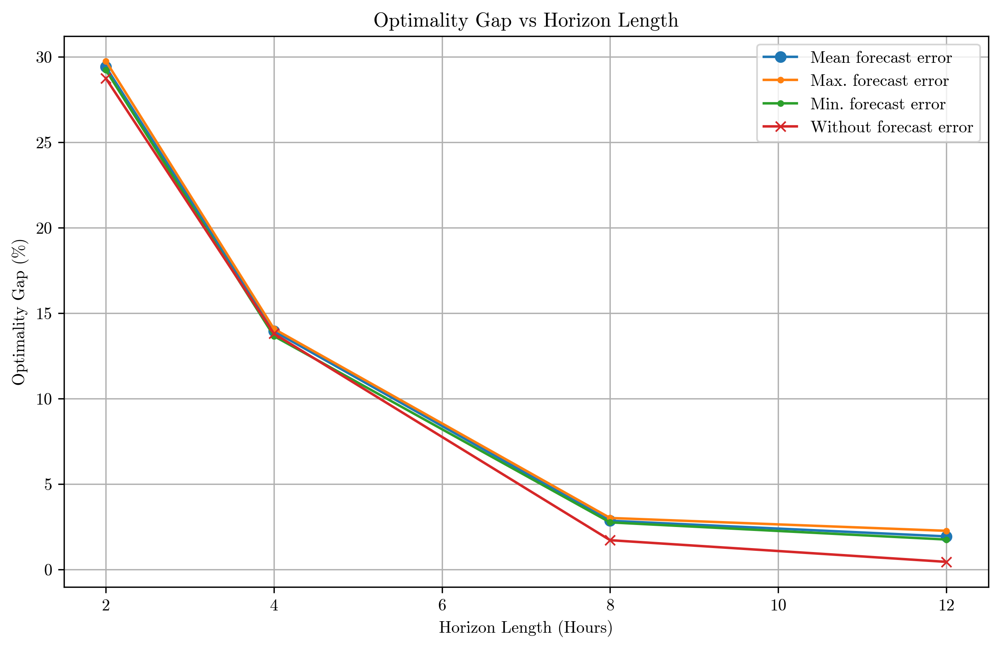

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict.keys())
optimality_gaps_uncertain = [(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_max =[(abs(value[1] - np.max(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_min= [(abs(value[1] - np.min(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]


optimality_gaps = [(abs(value[1] - np.min(value[0][0]) )/value[1])*100 for value in cost_dict.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length')
plt.grid(True)
plt.savefig("optim_hl_errors_3mo.png")
plt.show()


# Experiment 1: 12 month effect of horizon length

In [ ]:
horizon_list = [2,4,8,12]

cost_dict = {}
for horizon in horizon_list:

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*12
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
    for iter in range(6):
        print(f"iter {iter}")
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter > 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    

    if horizon == 2:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    cost_dict[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5


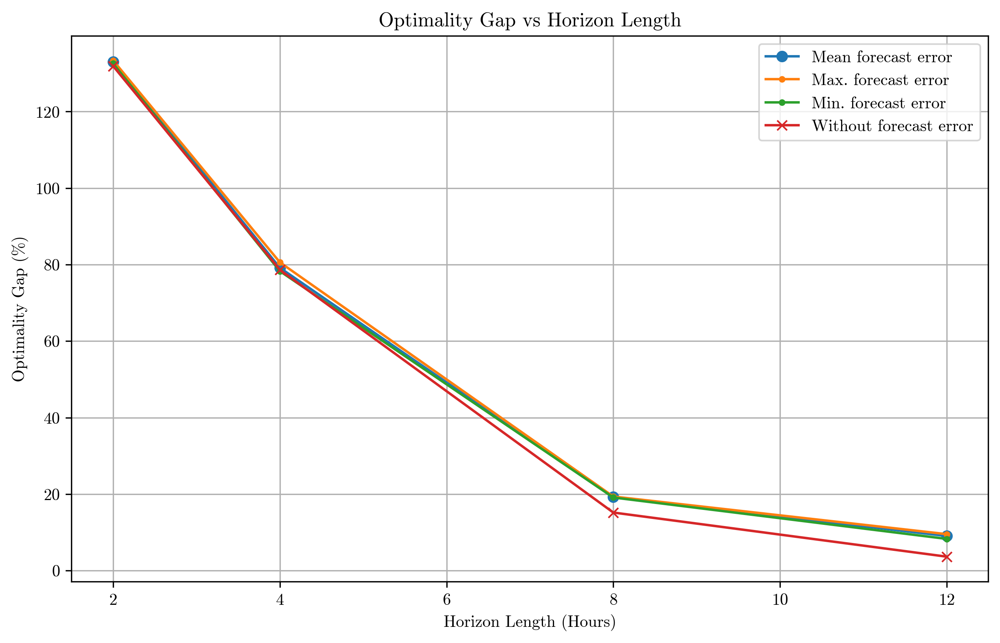

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict.keys())
optimality_gaps_uncertain = [(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_max =[(abs(value[1] - np.max(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_min= [(abs(value[1] - np.min(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]


optimality_gaps = [(abs(value[1] - np.min(value[0][0]) )/value[1])*100 for value in cost_dict.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length')
plt.grid(True)
plt.savefig("optim_hl_errors_12mo.png")
plt.show()


# Optimality gap variation with only PV uncertainty

In [ ]:
horizon_list = [2,4,8,12]

cost_dict_pv = {}
for horizon in horizon_list:

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*2
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    Sn = 6
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
    for iter in range(Sn+1):
        print(f"iter {iter}")
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter > 0:
                np.random.seed(SEED)
                #demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                #demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    

    if horizon == 2:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    cost_dict_pv[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6


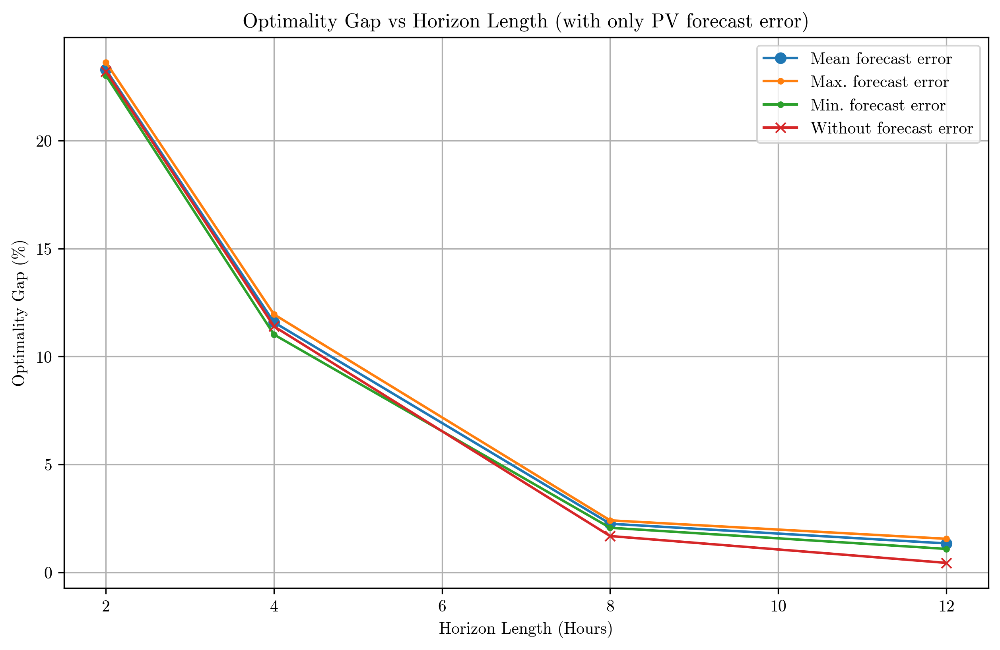

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict_pv.keys())
optimality_gaps_uncertain = [(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict_pv.values()]
optimality_gaps_uncertain_max =[(abs(value[1] - np.max(value[0][1:]) )/value[1])*100 for value in cost_dict_pv.values()]
optimality_gaps_uncertain_min= [(abs(value[1] - np.min(value[0][1:]) )/value[1])*100 for value in cost_dict_pv.values()]


optimality_gaps = [(abs(value[1] - np.min(value[0][0]) )/value[1])*100 for value in cost_dict_pv.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length (with only PV forecast error)')
plt.grid(True)
plt.savefig("optim_hl_errorsPV_2mo.png")
plt.show()


# Optimality gap variation with only load uncertainty

In [ ]:
horizon_list = [2,4,8,12]

cost_dict_load = {}
for horizon in horizon_list:

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*2
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    
    Sn = 5
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    average_rolling_horizon_cost = []
    for iter in range(Sn+1):
        print(f"iter {iter}")
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter > 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                #PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                #PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    

    if horizon == 2:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    cost_dict_load[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5


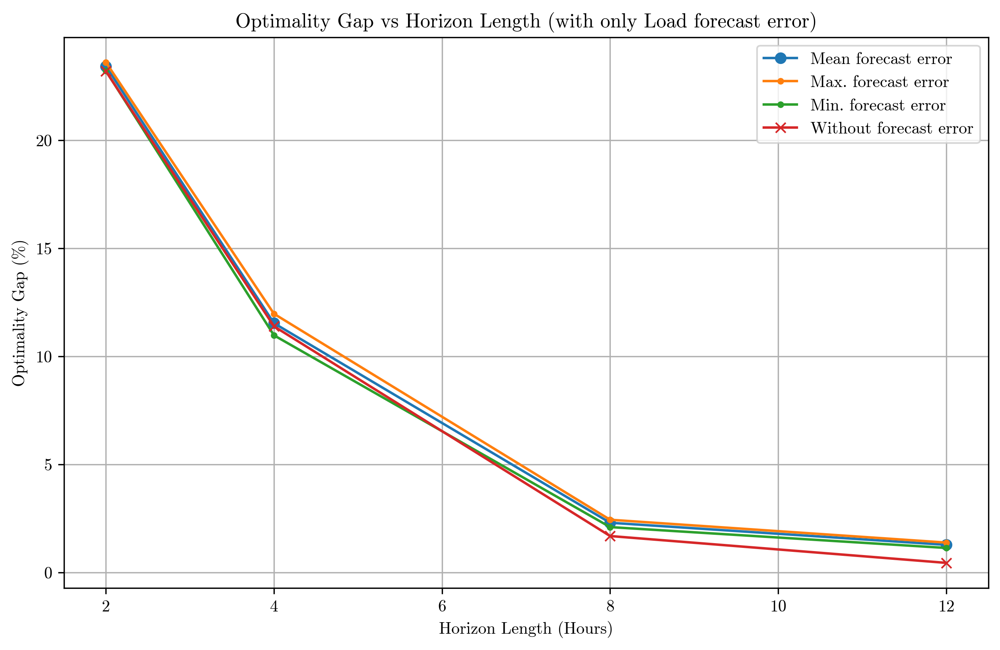

In [ ]:
# Extracting data for plotting
horizon_lengths = list(cost_dict_load.keys())
optimality_gaps_uncertain = [(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict_load.values()]
optimality_gaps_uncertain_max =[(abs(value[1] - np.max(value[0][1:]) )/value[1])*100 for value in cost_dict_load.values()]
optimality_gaps_uncertain_min= [(abs(value[1] - np.min(value[0][1:]) )/value[1])*100 for value in cost_dict_load.values()]


optimality_gaps = [(abs(value[1] - np.min(value[0][0]) )/value[1])*100 for value in cost_dict_load.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length (with only Load forecast error)')

plt.grid(True)
plt.savefig("optim_hl_errorsLOAD_2mo.png")
plt.show()


In [ ]:
# File path where the dictionary will be stored
file_path = 'cost_dict_uncertain_12mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(cost_dict, file)

print(f"Dictionary has been saved to {file_path}")


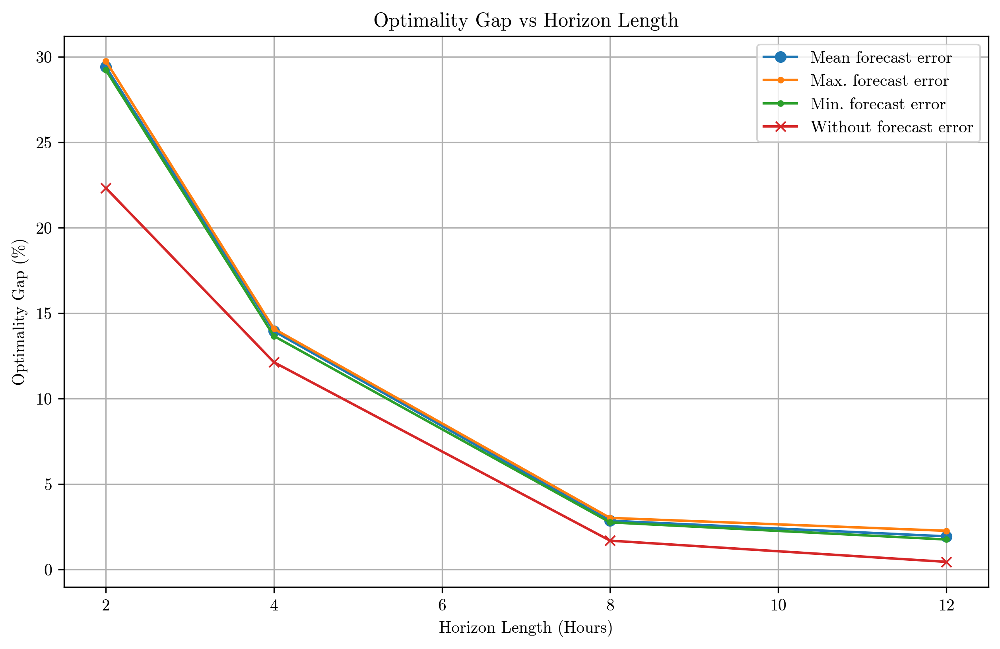

In [ ]:


# Extracting data for plotting
horizon_lengths = list(cost_dict.keys())
optimality_gaps_uncertain = [(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_max =[(abs(value[1] - np.max(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]
optimality_gaps_uncertain_min= [(abs(value[1] - np.min(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]


optimality_gaps = [(1-value[1] /value[0][0] )*100 for value in cost_dict.values()]

# Plotting the data
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(horizon_lengths, optimality_gaps_uncertain, marker='o', label="Mean forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_max, marker='.', label="Max. forecast error")
plt.plot(horizon_lengths, optimality_gaps_uncertain_min, marker='.', label="Min. forecast error")


plt.plot(horizon_lengths, optimality_gaps, marker='x', label="Without forecast error")
plt.legend()
plt.xlabel('Horizon Length (Hours)')
plt.ylabel('Optimality Gap (%)')
plt.title('Optimality Gap vs Horizon Length')
plt.grid(True)
plt.savefig("optim_hl_errors_12mo.png")
plt.show()


In [ ]:
[(abs(value[1] - np.mean(value[0][1:]) )/value[1])*100 for value in cost_dict.values()]

[29.41918232285685, 13.94878188106142, 2.8531862503732546, 1.936761103570652]

In [ ]:
cost_dict

{2: ([58231.04710665239,
   58499.47979794263,
   58448.88801733623,
   58687.890267635245,
   58518.72128420261,
   58517.051072203045],
  45228.53956984562),
 4: ([51472.47391902728,
   51569.0232360076,
   51596.4771969684,
   51600.15575573369,
   51407.69483595572,
   51513.49848749931],
  45228.53956984562),
 8: ([46004.1760400236,
   46510.37873569717,
   46539.7634133211,
   46592.549914371324,
   46475.63948827487,
   46476.63865882096],
  45228.53956984562),
 12: ([45430.85908445541,
   46076.0726038322,
   46053.112689282934,
   46021.963274704154,
   46118.94462457253,
   46252.448467345435],
  45228.53956984562)}

In [ ]:
import pickle


# File path where the dictionary will be stored
file_path = 'cost_dict_uncertain_bruho.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(cost_dict, file)

print(f"Dictionary has been saved to {file_path}")


Dictionary has been saved to cost_dict_uncertain_bruho.pkl


# Impact of different scenario numbers

In [ ]:
[58231.04710665239, 58499.47979794263, 58448.88801733623, 58687.890267635245, 58518.72128420261, 58517.051072203045]

In [ ]:
horizon_list = [8,12]

scenario_dict = {}
for horizon in horizon_list:

    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*30*2
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    
    
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    start_time = 2920
    average_rolling_horizon_cost = []
    for iter in range(20):
        print(f"iter {iter}")
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter >= 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print(average_rolling_horizon_cost)
    if horizon ==50:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    scenario_dict[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6
iter 7
7
iter 8
8
iter 9
9
iter 10
10
iter 11
11
iter 12
12
iter 13
13
iter 14
14
iter 15
15
iter 16
16
iter 17
17
iter 18
18
iter 19
19
[39041.427859192634, 39056.700631077285, 39092.62100951083, 38997.968190731954, 39049.64521235415, 38982.197865267255, 38965.92572878404, 39039.94036674229, 38993.43971396076, 38931.23496066871, 39101.31682098273, 39009.548562423064, 39423.203370329466, 38969.15413832107, 39078.529473277005, 39025.77095663952, 38981.42401300367, 39059.44404652771, 39031.75067177501, 39080.17086075287]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6
iter 7
7
iter 8
8
iter 9
9
iter 10
10
iter 11
11
iter 12
12
iter 13
13
iter 14
14
iter 15
15
iter 16
16
iter 17
17
iter 18
18
iter 19
19
[38676.48479659876, 38692.14560031339, 38639.89819477347, 38628.96220057

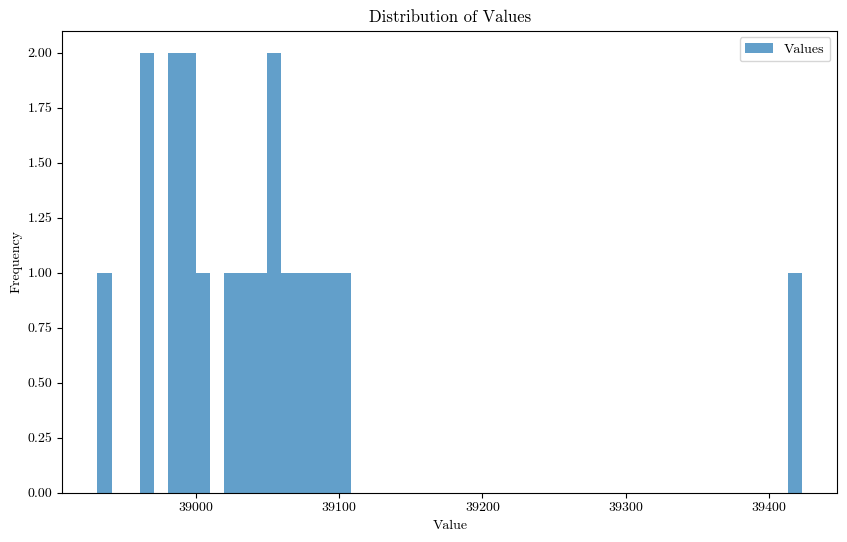

In [70]:
# Create histogram
plt.figure(figsize=(10, 6))
plt.hist(scenario_dict[8][0][1:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()

# Show the plot
plt.show()

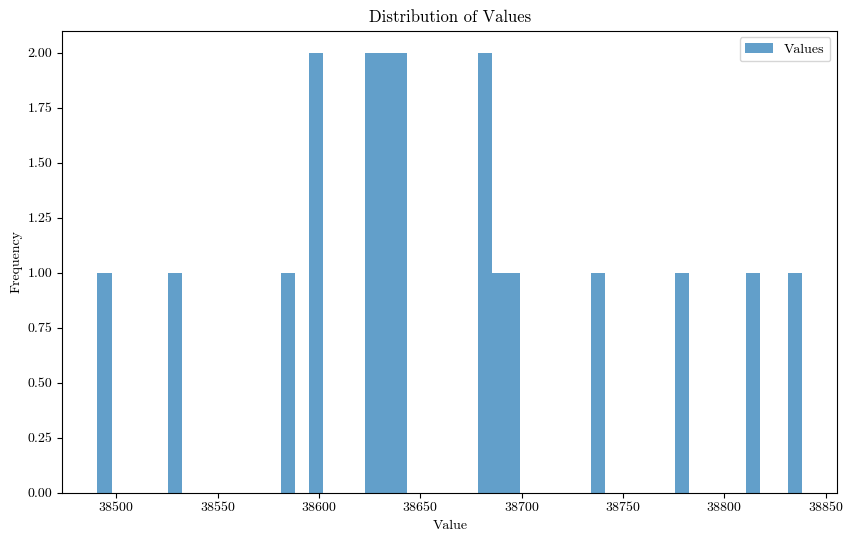

In [71]:
# Create histogram
plt.figure(figsize=(10, 6))
plt.hist(scenario_dict[12][0][1:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()

# Show the plot
plt.show()

In [212]:
horizon_list = [2,4,6,8,10,12]

scenario_dict2 = {}
for horizon in horizon_list:
    # Constants
    NUM_CONSUMERS = 3
    SIMULATION_DURATION = 24*14
    HORIZON_LENGTH = horizon # Planning horizon length in hours
    INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
    PRICE_SPREAD = 0.05  # Price spread for trades
    CHARGING_LIMIT = 2 # Battery charging limit
    TRADE_COST_ENABLED = True  # Flag for enabling trade costs
    UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
    CHARGING_EFFICIENCY = 0.95  # Charging efficiency
    eta=CHARGING_EFFICIENCY
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
    # price_set = np.where(price_set < 0, 5, price_set)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print("Initial SOC:", current_SOC)
    print("Max capacity:", max_capacity)
    start_time = 4000
    
    
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    start_time = 2920
    average_rolling_horizon_cost = []
    for iter in range(30):
        print(f"iter {iter}")
        # Simulation loop
        # Initialize simulation variables
        total_rolling_horizon_cost = 0
        print(iter)
        rolling_horizon_costs = []
        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        
        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1
        start_time = 0
        for hour in range(SIMULATION_DURATION):

            SEED = int( (hour + iter)*math.pi) # Seed for random number generator
            # Initialize random seed
            
        
            horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)
    
            
            demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
            PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]
            
            
            if iter >= 0:
                np.random.seed(SEED)
                demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                demand_subset = np.clip(demand_subset, 0, None)
                PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                PV_generation_subset = np.clip(PV_generation_subset, 0, None)
            
            
            price_subset = price_set[start_time+hour:start_time+horizon_end]
            
            try:
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                )
                
                current_SOC = updated_SOC[0]  # Update SOC for the next iteration
             
            except Exception as e:
                print(current_SOC)
                print(hour)
                print(iter)
                print(PV_generation_subset)
                print(demand_subset)
                print(price_subset)
                print(f"Optimization failed at hour {hour}: {e}")
                total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                    INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                    demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                )
                
            
                
            
            # Update costs and SOC for the next iteration
            rolling_horizon_costs.append(current_cost)
            total_rolling_horizon_cost += current_cost
    
        #print(total_rolling_horizon_cost)
        average_rolling_horizon_cost.append(total_rolling_horizon_cost)
    

    
    #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)
    
    # Data initialization
    price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
    # Convert arrays to float to avoid typecasting issues later
    demand_set = demand_list.astype(float)
    PV_generation_set = PV_list.astype(float)
    
    # Initialize State of Charge (SOC)
    max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
    current_SOC = max_capacity*0.1
    
    print(average_rolling_horizon_cost)
    if horizon ==50:
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]
        
        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )
        
       
    
    
        total_deterministic_costs = [sum(sublist) for sublist in cost_list]
    
    scenario_dict2[horizon] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
iter 6
6
iter 7
7
iter 8
8
iter 9
9
iter 10
10
iter 11
11
iter 12
12
iter 13
13
iter 14
14
iter 15
15
iter 16
16
iter 17
17
iter 18
18
iter 19
19
iter 20
20
iter 21
21
iter 22
22
iter 23
23
iter 24
24
iter 25
25
iter 26
26
iter 27
27
iter 28
28
iter 29
29
[10889.533948928254, 10918.916944186094, 10958.475368634798, 10905.77284566805, 10916.440821785627, 10927.61401471245, 10867.454159532239, 10939.972246662128, 10884.85846619776, 10928.314594788728, 10902.386280544204, 10873.544921443643, 10890.084353589098, 10912.834373090294, 10950.562026231455, 10953.263835009875, 10939.117525332833, 10984.340728918432, 10897.8526924416, 10886.911188130669, 10936.172656502318, 10949.426212921919, 10949.675243582873, 10962.377474315323, 10925.100194110062, 10974.747684451353, 10912.455227517556, 10958.793423917374, 10936.507653846547, 10932.553045197072]
Initial SOC: [0.036  0.0

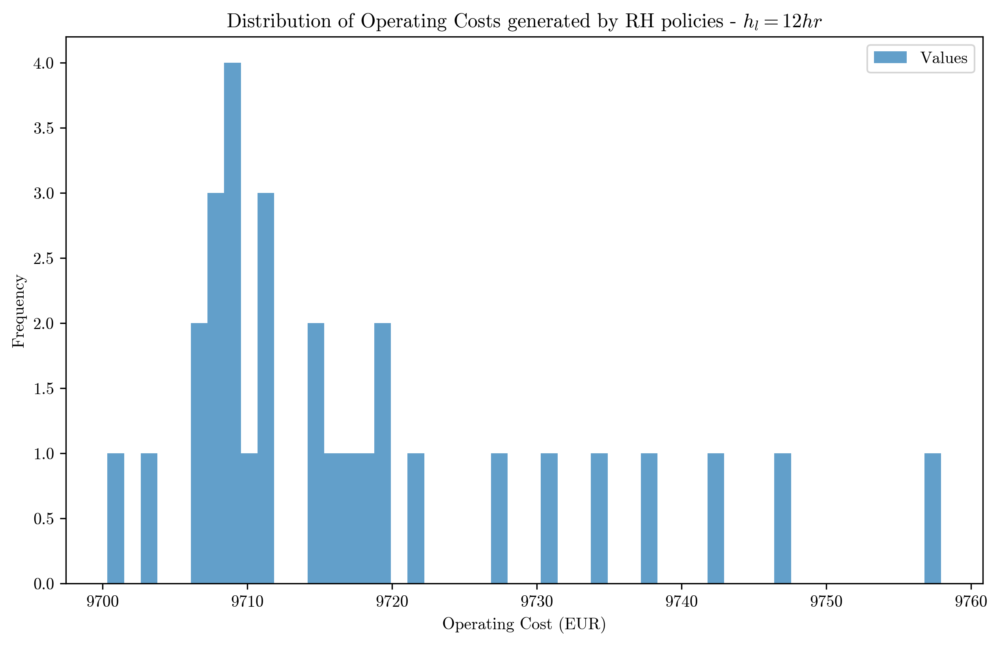

Maximum Value: 9757.94079823517
Minimum Value: 9700.34352843154
Range: 57.59726980362939
Midpoint: 9729.142163333356
Percentage Range: 0.5920076902637803


In [237]:
# Create histogram
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(scenario_dict2[12][0][:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Operating Costs generated by RH policies - $h_l = 12hr$')

plt.xlabel('Operating Cost (EUR)')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("12hr-distro.png")
# Show the plot
plt.show()


data = scenario_dict2[12][0][:]

# Calculate maximum and minimum values
max_value = np.max(data)
min_value = np.min(data)

# Calculate the range
range_value = max_value - min_value

# Calculate the midpoint
midpoint = (max_value + min_value) / 2

# Calculate the percentage range relative to the midpoint
percentage_range = (range_value / midpoint) * 100

print("Maximum Value:", max_value)
print("Minimum Value:", min_value)
print("Range:", range_value)
print("Midpoint:", midpoint)
print("Percentage Range:", percentage_range)

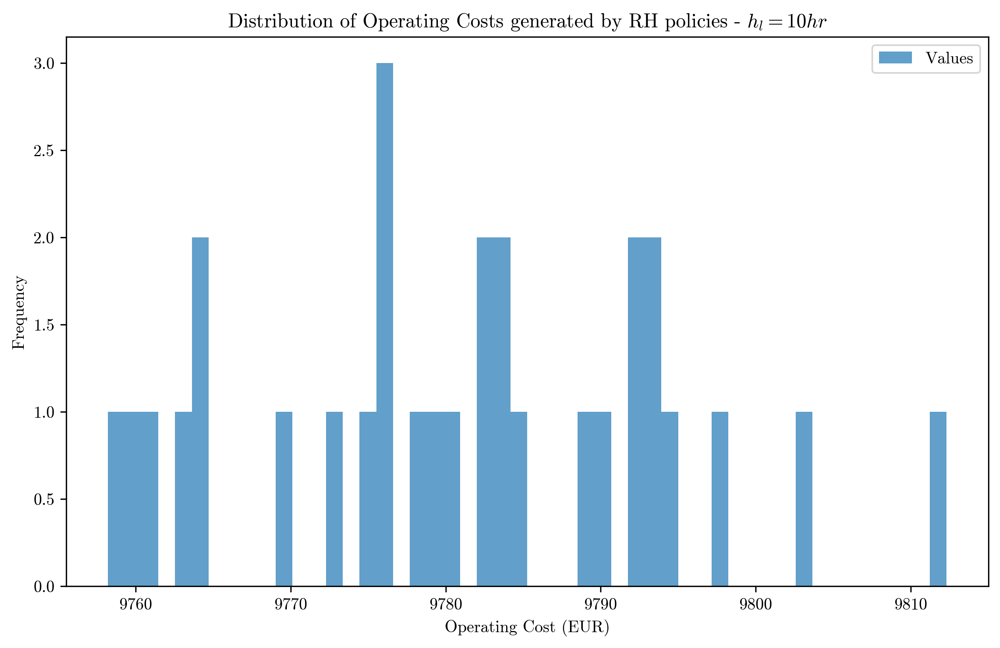

Maximum Value: 9812.304416813791
Minimum Value: 9758.209949538103
Range: 54.09446727568866
Midpoint: 9785.257183175947
Percentage Range: 0.5528159992431749


In [236]:
# Create histogram
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(scenario_dict2[10][0][:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Operating Costs generated by RH policies - $h_l = 10hr$')

plt.xlabel('Operating Cost (EUR)')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("10hr-distro.png")
# Show the plot
plt.show()


data = scenario_dict2[10][0][:]

# Calculate maximum and minimum values
max_value = np.max(data)
min_value = np.min(data)

# Calculate the range
range_value = max_value - min_value

# Calculate the midpoint
midpoint = (max_value + min_value) / 2

# Calculate the percentage range relative to the midpoint
percentage_range = (range_value / midpoint) * 100

print("Maximum Value:", max_value)
print("Minimum Value:", min_value)
print("Range:", range_value)
print("Midpoint:", midpoint)
print("Percentage Range:", percentage_range)

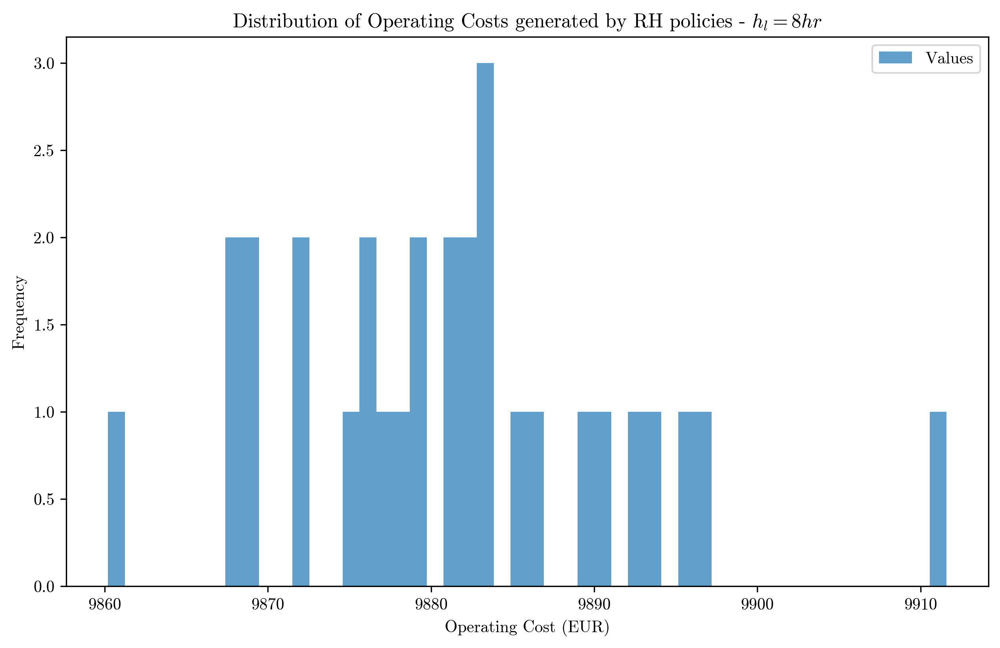

Maximum Value: 9911.585122223181
Minimum Value: 9860.200271965761
Range: 51.38485025742011
Midpoint: 9885.89269709447
Percentage Range: 0.5197795670240529


In [235]:
# Create histogram
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(scenario_dict2[8][0][:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Operating Costs generated by RH policies - $h_l = 8hr$')

plt.xlabel('Operating Cost (EUR)')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("8hr-distro.png")
# Show the plot
plt.show()


data = scenario_dict2[8][0][:]

# Calculate maximum and minimum values
max_value = np.max(data)
min_value = np.min(data)

# Calculate the range
range_value = max_value - min_value

# Calculate the midpoint
midpoint = (max_value + min_value) / 2

# Calculate the percentage range relative to the midpoint
percentage_range = (range_value / midpoint) * 100

print("Maximum Value:", max_value)
print("Minimum Value:", min_value)
print("Range:", range_value)
print("Midpoint:", midpoint)
print("Percentage Range:", percentage_range)

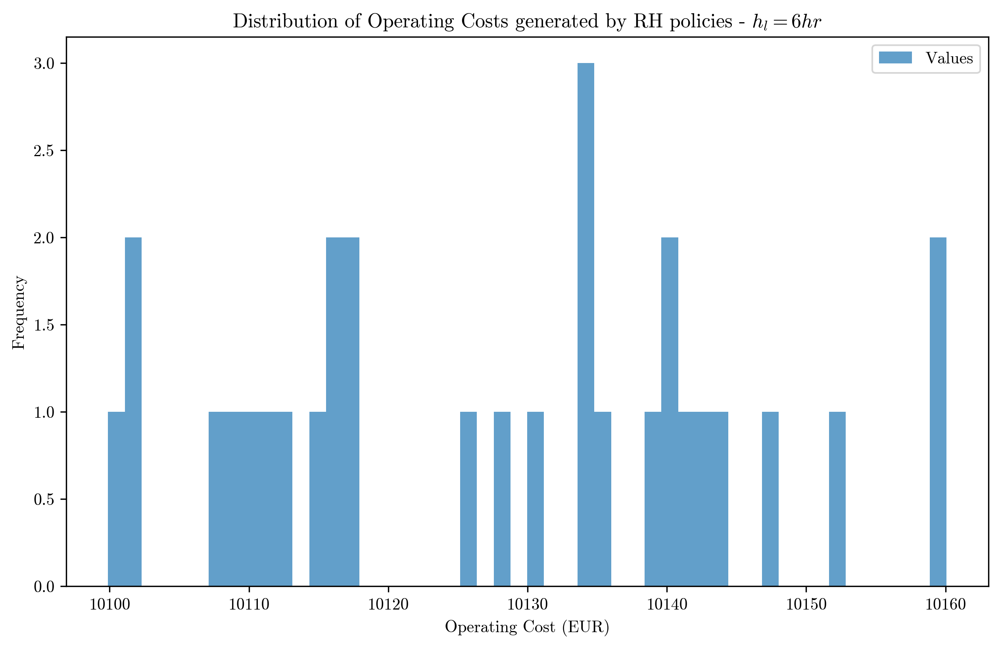

Maximum Value: 10160.067615567123
Minimum Value: 10099.883196566027
Range: 60.1844190010961
Midpoint: 10129.975406066575
Percentage Range: 0.594122064354206


In [234]:
# Create histogram
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(scenario_dict2[6][0][:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Operating Costs generated by RH policies - $h_l = 6hr$')

plt.xlabel('Operating Cost (EUR)')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("6hr-distro.png")
# Show the plot
plt.show()


data = scenario_dict2[6][0][:]

# Calculate maximum and minimum values
max_value = np.max(data)
min_value = np.min(data)

# Calculate the range
range_value = max_value - min_value

# Calculate the midpoint
midpoint = (max_value + min_value) / 2

# Calculate the percentage range relative to the midpoint
percentage_range = (range_value / midpoint) * 100

print("Maximum Value:", max_value)
print("Minimum Value:", min_value)
print("Range:", range_value)
print("Midpoint:", midpoint)
print("Percentage Range:", percentage_range)

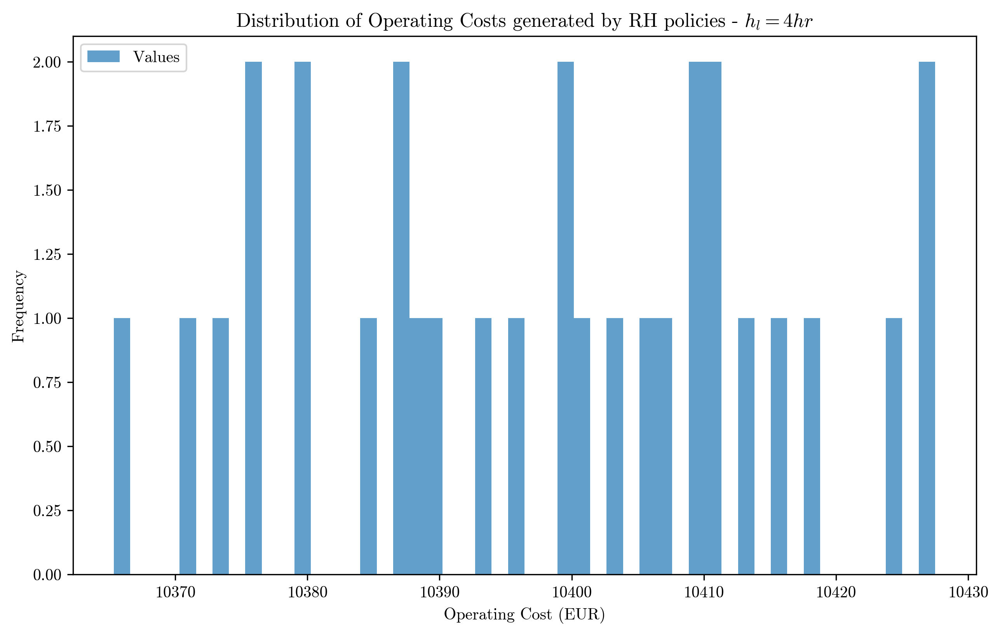

Maximum Value: 10427.493224086951
Minimum Value: 10365.359310891494
Range: 62.13391319545735
Midpoint: 10396.426267489223
Percentage Range: 0.5976468412973502


In [232]:
# Create histogram
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(scenario_dict2[4][0][:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Operating Costs generated by RH policies - $h_l = 4hr$')
plt.xlabel('Operating Cost (EUR)')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("4hr-distro.png")
# Show the plot
plt.show()

data = scenario_dict2[4][0][:]

# Calculate maximum and minimum values
max_value = np.max(data)
min_value = np.min(data)

# Calculate the range
range_value = max_value - min_value

# Calculate the midpoint
midpoint = (max_value + min_value) / 2

# Calculate the percentage range relative to the midpoint
percentage_range = (range_value / midpoint) * 100

print("Maximum Value:", max_value)
print("Minimum Value:", min_value)
print("Range:", range_value)
print("Midpoint:", midpoint)
print("Percentage Range:", percentage_range)

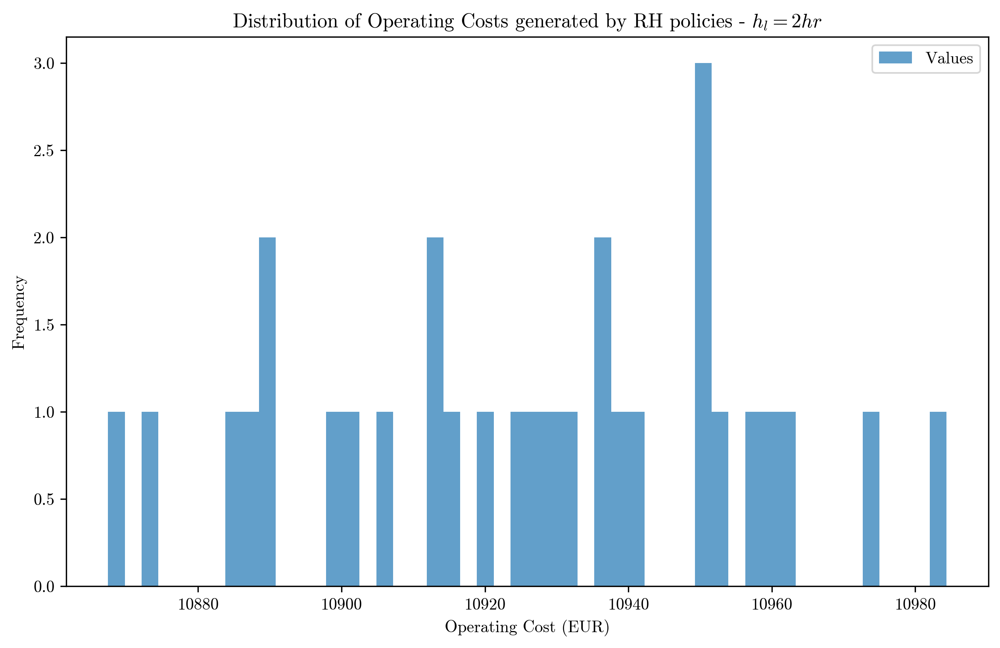

Maximum Value: 10984.340728918432
Minimum Value: 10867.454159532239
Range: 116.88656938619351
Midpoint: 10925.897444225335
Percentage Range: 1.0698120679136667


In [233]:
# Create histogram
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(scenario_dict2[2][0][:], bins=50, alpha=0.7, label='Values')
#plt.axvline(x=scenario_dict[8][0][0], color='r', linestyle='dashed', linewidth=2, label='Benchmark (first value)')

# Adding titles and labels
plt.title('Distribution of Operating Costs generated by RH policies - $h_l = 2hr$')
plt.xlabel('Operating Cost (EUR)')
plt.ylabel('Frequency')
plt.legend()
plt.savefig("2hr-distro.png")
# Show the plot
plt.show()


data = scenario_dict2[2][0][:]

# Calculate maximum and minimum values
max_value = np.max(data)
min_value = np.min(data)

# Calculate the range
range_value = max_value - min_value

# Calculate the midpoint
midpoint = (max_value + min_value) / 2

# Calculate the percentage range relative to the midpoint
percentage_range = (range_value / midpoint) * 100

print("Maximum Value:", max_value)
print("Minimum Value:", min_value)
print("Range:", range_value)
print("Midpoint:", midpoint)
print("Percentage Range:", percentage_range)

# eta and hl

In [82]:
horizon_list = [2,4,6,8,12]
eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]

scenario_dict3 = {}

Sn = 5
for horizon in horizon_list:
    scenario_dict3[horizon] = {}
    for eta in eta_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30
        HORIZON_LENGTH = horizon # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = 2 # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        start_time = 4000


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 2920
        average_rolling_horizon_cost = []
        for iter in range(Sn+1):
            print(f"iter {iter}")
            # Simulation loop
            # Initialize simulation variables
            total_rolling_horizon_cost = 0
            print(iter)
            rolling_horizon_costs = []
            # Data initialization
            price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
            # Convert arrays to float to avoid typecasting issues later
            demand_set = demand_list.astype(float)
            PV_generation_set = PV_list.astype(float)

            # Initialize State of Charge (SOC)
            max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
            current_SOC = max_capacity*0.1
            start_time = 0
            for hour in range(SIMULATION_DURATION):

                SEED = int( (hour + iter)*math.pi) # Seed for random number generator
                # Initialize random seed


                horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)


                demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
                PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]


                if iter > 0:
                    np.random.seed(SEED)
                    demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                    demand_subset = np.clip(demand_subset, 0, None)
                    PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                    PV_generation_subset = np.clip(PV_generation_subset, 0, None)


                price_subset = price_set[start_time+hour:start_time+horizon_end]

                try:
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                    )

                    current_SOC = updated_SOC[0]  # Update SOC for the next iteration

                except Exception as e:
                    print(current_SOC)
                    print(hour)
                    print(iter)
                    print(PV_generation_subset)
                    print(demand_subset)
                    print(price_subset)
                    print(f"Optimization failed at hour {hour}: {e}")
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                    )




                # Update costs and SOC for the next iteration
                rolling_horizon_costs.append(current_cost)
                total_rolling_horizon_cost += current_cost

            #print(total_rolling_horizon_cost)
            average_rolling_horizon_cost.append(total_rolling_horizon_cost)



        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==2:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict3[horizon][eta] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[26315.714773011423, 26328.55741381865, 26296.315147001584, 26296.668815502606, 26278.78338972379, 26278.650172754158]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[26363.993080033048, 26385.57793468145, 26350.06779550448, 26354.684577321055, 26307.70852008295, 26316.44099752538]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[26478.673240940174, 26422.32619545525, 26475.442835928992, 26545.932295701077, 26469.73241427572, 26441.28297169949]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[26025.861638297338, 26138.010900921206, 26058.93402756845, 26057.50729234525, 26121.2822720273, 26010.65575019646]
Initial SOC: [0.036  0.081  0.4275

In [81]:
scenario_dict3

{2: {0.8: ([1264.4448583572516, 1265.2778371564273, 1257.341160821853],
   905.5375918336941),
  0.85: ([1258.2397230207973, 1259.1930500546232, 1250.3762693996164],
   864.035449029974)},
 4: {0.8: ([1214.240227757538, 1196.5404570880507, 1215.0149752401996],
   864.035449029974),
  0.85: ([1212.2339133970822, 1183.6797223307165, 1203.7442611961071],
   864.035449029974)}}

In [83]:
import pickle


# File path where the dictionary will be stored
file_path = 'hl_eta_errors_1mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict3, file)

print(f"Dictionary has been saved to {file_path}")


Dictionary has been saved to hl_eta_errors_1mo.pkl


In [3]:
import pickle
# File path from where the dictionary will be loaded
file_path = 'hl_eta_errors_1mo.pkl'

# Loading the dictionary from the file
with open(file_path, 'rb') as file:
    scenario_dict3 = pickle.load(file)

print("Dictionary has been loaded successfully.")
print(scenario_dict3)

Dictionary has been loaded successfully.
{2: {0.8: ([26315.714773011423, 26328.55741381865, 26296.315147001584, 26296.668815502606, 26278.78338972379, 26278.650172754158], 23826.28229672091), 0.85: ([26363.993080033048, 26385.57793468145, 26350.06779550448, 26354.684577321055, 26307.70852008295, 26316.44099752538], 23325.981848208023), 0.9: ([26478.673240940174, 26422.32619545525, 26475.442835928992, 26545.932295701077, 26469.73241427572, 26441.28297169949], 22666.070022299657), 0.95: ([26025.861638297338, 26138.010900921206, 26058.93402756845, 26057.50729234525, 26121.2822720273, 26010.65575019646], 21833.700523626958), 0.99: ([24789.22987077903, 24854.35735782333, 24824.31267405127, 24798.97105980829, 24907.57462924747, 24794.002265894705], 21043.86717090622)}, 4: {0.8: ([25709.102433016833, 25654.460830679138, 25793.225690796116, 25795.12912276445, 25733.992948092848, 25719.692701855955], 21043.86717090622), 0.85: ([25607.1063869014, 25589.5037094958, 25620.159480185514, 25658.58294

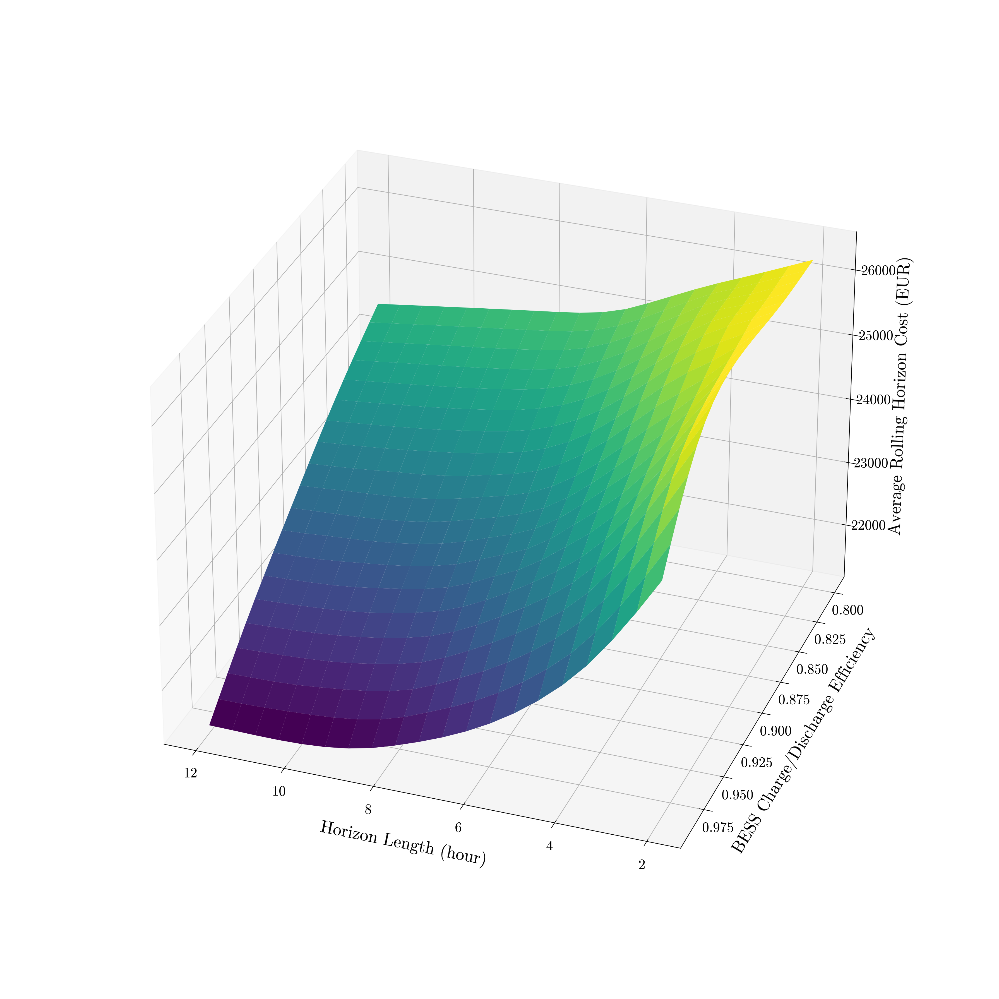

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


horizons = []
etas = []
costs = []

# Extract data and compute averages
for horizon, eta_dict in scenario_dict3.items():
    for eta, (cost_list, _) in eta_dict.items():
        horizons.append(horizon)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list

# Create grid coordinates for plotting
horizon_grid = np.linspace(min(horizons), max(horizons), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), costs, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_hl_eta_1mo.png', bbox_inches='tight')

plt.show()

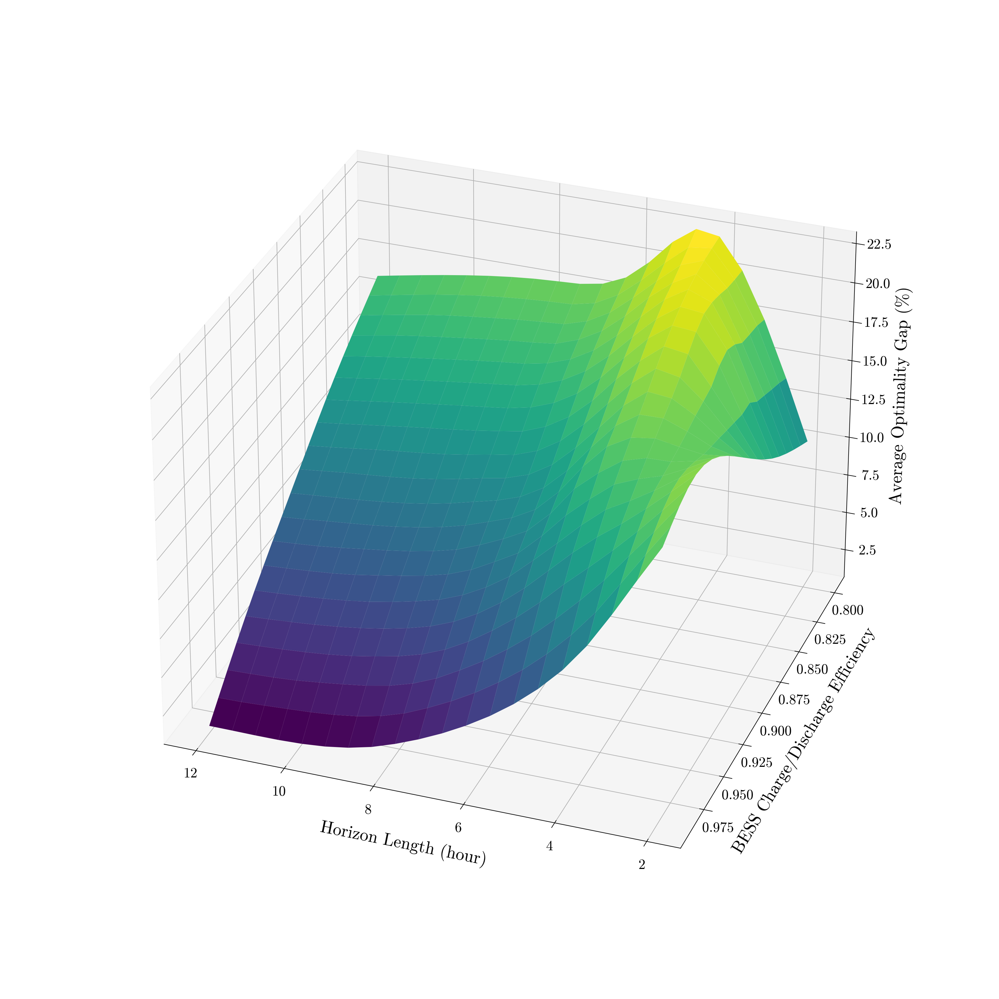

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


horizons = []
etas = []
costs = []
optimality_gap = []

# Extract data and compute averages
for horizon, eta_dict in scenario_dict3.items():
    for eta, (cost_list, det_cost) in eta_dict.items():
        horizons.append(horizon)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list
        optimality_gap.append( (abs(det_cost - np.mean(cost_list))/det_cost)*100)

# Create grid coordinates for plotting
horizon_grid = np.linspace(min(horizons), max(horizons), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), optimality_gap, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_hl_eta_1mo_optimality.png', bbox_inches='tight')

plt.show()

# C-rate, eta

In [92]:
crate_list = [0,0.05,0.10,0.20,0.50,1.0,2]
eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]

scenario_dict4 = {}

Sn = 5
for crate in crate_list:
    scenario_dict4[crate] = {}
    for eta in eta_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 6 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = crate # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []
        for iter in range(Sn+1):
            print(f"iter {iter}")
            # Simulation loop
            # Initialize simulation variables
            total_rolling_horizon_cost = 0
            print(iter)
            rolling_horizon_costs = []
            # Data initialization
            price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
            # Convert arrays to float to avoid typecasting issues later
            demand_set = demand_list.astype(float)
            PV_generation_set = PV_list.astype(float)

            # Initialize State of Charge (SOC)
            max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
            current_SOC = max_capacity*0.1
            start_time = 0
            for hour in range(SIMULATION_DURATION):

                SEED = int( (hour + iter)*math.pi) # Seed for random number generator
                # Initialize random seed


                horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)


                demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
                PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]


                if iter > 0:
                    np.random.seed(SEED)
                    demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                    demand_subset = np.clip(demand_subset, 0, None)
                    PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                    PV_generation_subset = np.clip(PV_generation_subset, 0, None)


                price_subset = price_set[start_time+hour:start_time+horizon_end]

                try:
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                    )

                    current_SOC = updated_SOC[0]  # Update SOC for the next iteration

                except Exception as e:
                    print(current_SOC)
                    print(hour)
                    print(iter)
                    print(PV_generation_subset)
                    print(demand_subset)
                    print(price_subset)
                    print(f"Optimization failed at hour {hour}: {e}")
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                    )




                # Update costs and SOC for the next iteration
                rolling_horizon_costs.append(current_cost)
                total_rolling_horizon_cost += current_cost

            #print(total_rolling_horizon_cost)
            average_rolling_horizon_cost.append(total_rolling_horizon_cost)



        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==2:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict4[crate][eta] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438]
Initial SOC: [0.036  0.081  0.4275]
Max capa

In [111]:
crate_list = [0,0.05,0.10,0.20,0.50,1.0,2]
eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]

scenario_dict4_optimal = {}

Sn = 5
for crate in crate_list:
    scenario_dict4_optimal[crate] = {}
    for eta in eta_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 6 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = 1  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = crate # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []




        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]

        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )




        total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict4_optimal[crate][eta] = total_cost_det
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [

In [94]:

# File path where the dictionary will be stored
file_path = 'crate_eta_errors_2mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict4, file)

print(f"Dictionary has been saved to {file_path}")


Dictionary has been saved to crate_eta_errors_2mo.pkl


In [114]:
scenario_dict4_optimal

{0: {0.8: 48294.47402862441,
  0.85: 48294.47402862441,
  0.9: 48294.47402862441,
  0.95: 48294.47402862441,
  0.99: 48294.47402862441},
 0.05: {0.8: 45620.79873660132,
  0.85: 45196.924984294186,
  0.9: 44656.53966409522,
  0.95: 43975.94453916438,
  0.99: 43351.349532316504},
 0.1: {0.8: 43974.89076476036,
  0.85: 43259.95800629178,
  0.9: 42300.81813830771,
  0.95: 41110.41488961038,
  0.99: 40020.93672008848},
 0.2: {0.8: 42246.85516666677,
  0.85: 41399.95708909083,
  0.9: 40242.32470942843,
  0.95: 38818.28786062448,
  0.99: 37481.50514783116},
 0.5: {0.8: 41762.81441709631,
  0.85: 40855.25174244442,
  0.9: 39629.61223595277,
  0.95: 38071.95416867513,
  0.99: 36583.779864525415},
 1.0: {0.8: 41761.2489764462,
  0.85: 40853.11568200297,
  0.9: 39621.39454731407,
  0.95: 38048.278854228796,
  0.99: 36550.335367427375},
 2: {0.8: 41761.2489764462,
  0.85: 40853.11568200298,
  0.9: 39621.39454731407,
  0.95: 38048.27885422879,
  0.99: 36550.33536742741}}

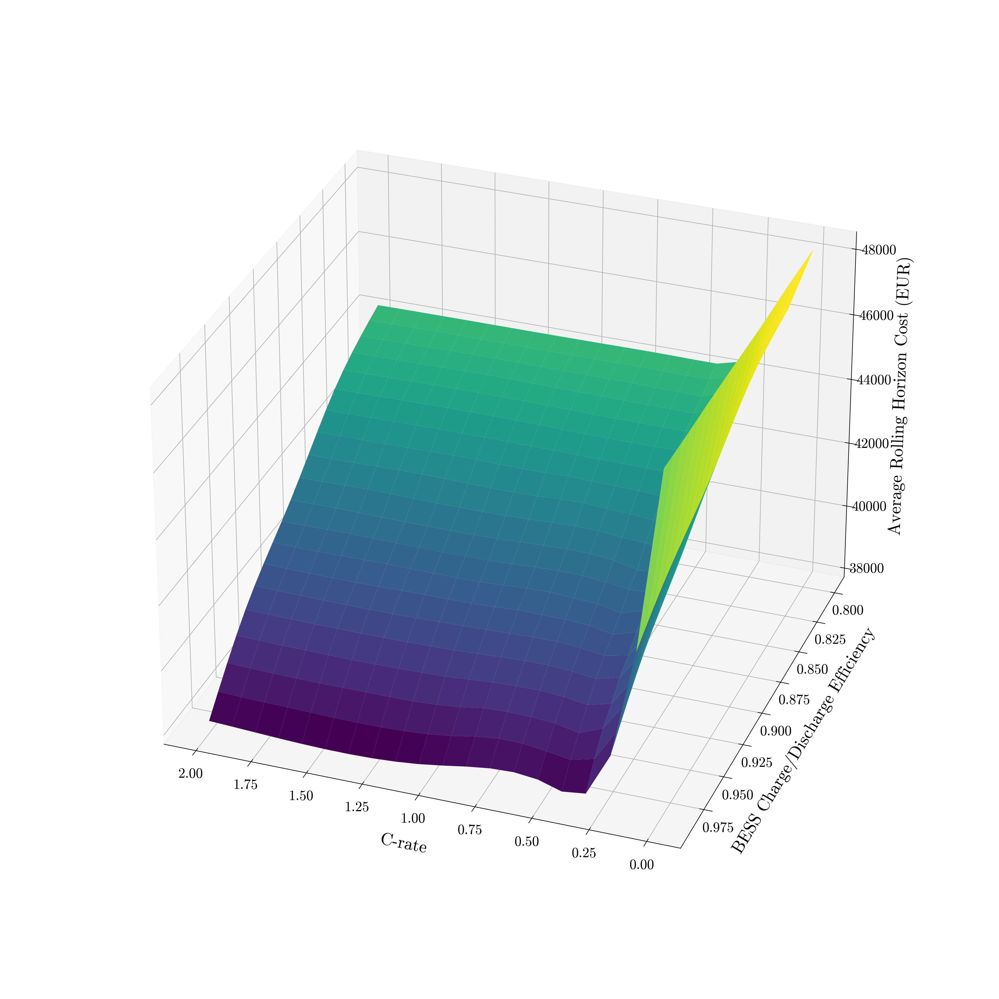

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


crates = []
etas = []
costs = []
det_costs = []

# Extract data and compute averages
for crate, eta_dict in scenario_dict4.items():
    #print(crate)
    for eta, (cost_list, _) in eta_dict.items():
        crates.append(crate)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list
        
scenario_dict4_optimal

# Extract data and compute averages
for crate, eta_dict in scenario_dict4_optimal.items():
    for eta,det_cost in eta_dict.items():
        #print(det_cost)
        
        det_costs.append(det_cost)
        
# Create grid coordinates for plotting
horizon_grid = np.linspace(min(crates), max(crates), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crates, etas), costs, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('erros_crate_eta_2mo.png', bbox_inches='tight')

plt.show()

In [118]:
costs = np.array(costs)
det_costs = np.array(det_costs)

optimality = (abs(det_costs - costs)/det_costs)*100
optimality

array([6.02632724e-14, 6.02632724e-14, 6.02632724e-14, 6.02632724e-14,
       6.02632724e-14, 3.76697874e+00, 4.20618264e+00, 3.94619730e+00,
       4.59974238e+00, 4.89723295e+00, 5.59849657e+00, 6.19932917e+00,
       5.94408697e+00, 6.90196879e+00, 7.45065855e+00, 7.02616609e+00,
       7.04876073e+00, 5.97630829e+00, 6.26739175e+00, 5.96501390e+00,
       6.06476196e+00, 6.03252159e+00, 4.95341784e+00, 5.19743488e+00,
       4.61746584e+00, 6.09221988e+00, 6.12256619e+00, 5.06141306e+00,
       5.24071934e+00, 4.24853122e+00, 6.07129928e+00, 6.10176674e+00,
       5.07341182e+00, 5.24470613e+00, 4.23751459e+00])

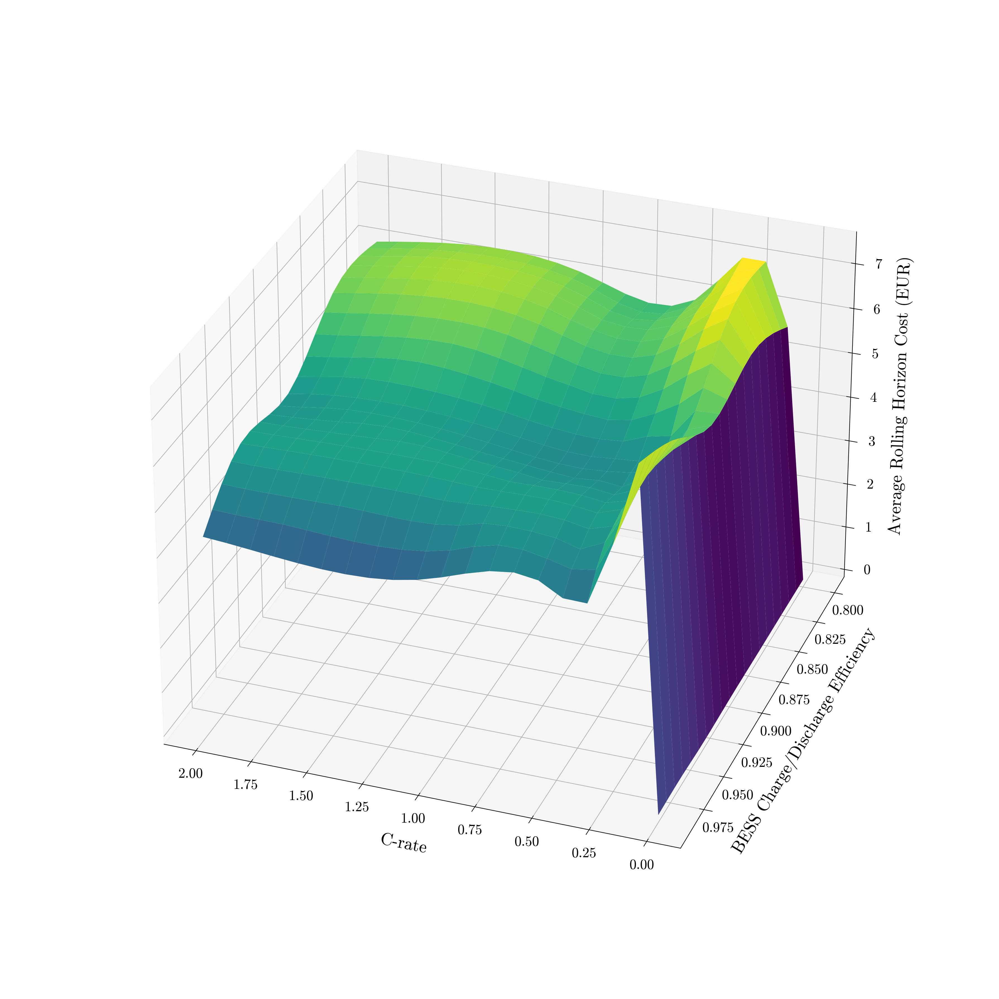

In [121]:

# Create grid coordinates for plotting
horizon_grid = np.linspace(min(crates), max(crates), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((crates, etas), optimality, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('erros_crate_eta_2mo_OG.png', bbox_inches='tight')

plt.show()

# EMG and eta

In [87]:
emg_list = [0,0.05,0.10,0.20,0.50,0.75,1.0]
eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]

scenario_dict5 = {}

Sn = 5
for emg in emg_list:
    scenario_dict5[emg] = {}
    for eta in eta_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 6 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = 2 # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []
        for iter in range(Sn+1):
            print(f"iter {iter}")
            # Simulation loop
            # Initialize simulation variables
            total_rolling_horizon_cost = 0
            print(iter)
            rolling_horizon_costs = []
            # Data initialization
            price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
            # Convert arrays to float to avoid typecasting issues later
            demand_set = demand_list.astype(float)
            PV_generation_set = PV_list.astype(float)

            # Initialize State of Charge (SOC)
            max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
            current_SOC = max_capacity*0.1
            start_time = 0
            for hour in range(SIMULATION_DURATION):

                SEED = int( (hour + iter)*math.pi) # Seed for random number generator
                # Initialize random seed


                horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)


                demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
                PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]


                if iter > 0:
                    np.random.seed(SEED)
                    demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                    demand_subset = np.clip(demand_subset, 0, None)
                    PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                    PV_generation_subset = np.clip(PV_generation_subset, 0, None)


                price_subset = price_set[start_time+hour:start_time+horizon_end]

                try:
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                    )

                    current_SOC = updated_SOC[0]  # Update SOC for the next iteration

                except Exception as e:
                    print(current_SOC)
                    print(hour)
                    print(iter)
                    print(PV_generation_subset)
                    print(demand_subset)
                    print(price_subset)
                    print(f"Optimization failed at hour {hour}: {e}")
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                    )




                # Update costs and SOC for the next iteration
                rolling_horizon_costs.append(current_cost)
                total_rolling_horizon_cost += current_cost

            #print(total_rolling_horizon_cost)
            average_rolling_horizon_cost.append(total_rolling_horizon_cost)



        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==2:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict5[emg][eta] = (average_rolling_horizon_cost,total_cost_det)
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[44438.55335755437, 44574.26427963274, 44425.546673539626, 44592.06892433772, 44460.36438640837, 44765.545093505614]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[43451.41344947128, 43682.56926887322, 43521.865611016205, 43561.30594134072, 43664.7756782268, 43878.255562278486]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[41825.02616568592, 42144.657598629376, 41978.30356255048, 41969.065522651676, 42083.806040542215, 42296.55372175691]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[39914.37631426056, 40245.887895988526, 40280.18529292234, 40276.9214012446, 40311.65930658013, 40470.19475674647]
Initial SOC: [0.036  0.081  0.4275]
Ma

In [122]:
emg_list = [0,0.05,0.10,0.20,0.50,0.75,1.0]
eta_list = [0.80, 0.85, 0.90, 0.95, 0.99]

scenario_dict5_optimal = {}

Sn = 5
for emg in emg_list:
    scenario_dict5_optimal[emg] = {}
    for eta in eta_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 6 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = 2 # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []
 


        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
 
        # Final aggregation and analysis
        final_demand_subset = demand_set[:, :SIMULATION_DURATION]
        final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
        final_price_subset = price_set[:SIMULATION_DURATION]

        total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
            INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
            final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
        )




        total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict5_optimal[emg][eta] = total_cost_det
    
  


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [

In [88]:

# File path where the dictionary will be stored
file_path = 'emg_eta_errors_2mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict5, file)

print(f"Dictionary has been saved to {file_path}")


Dictionary has been saved to emg_eta_errors_2mo.pkl


2
2
2
2
2
2
2


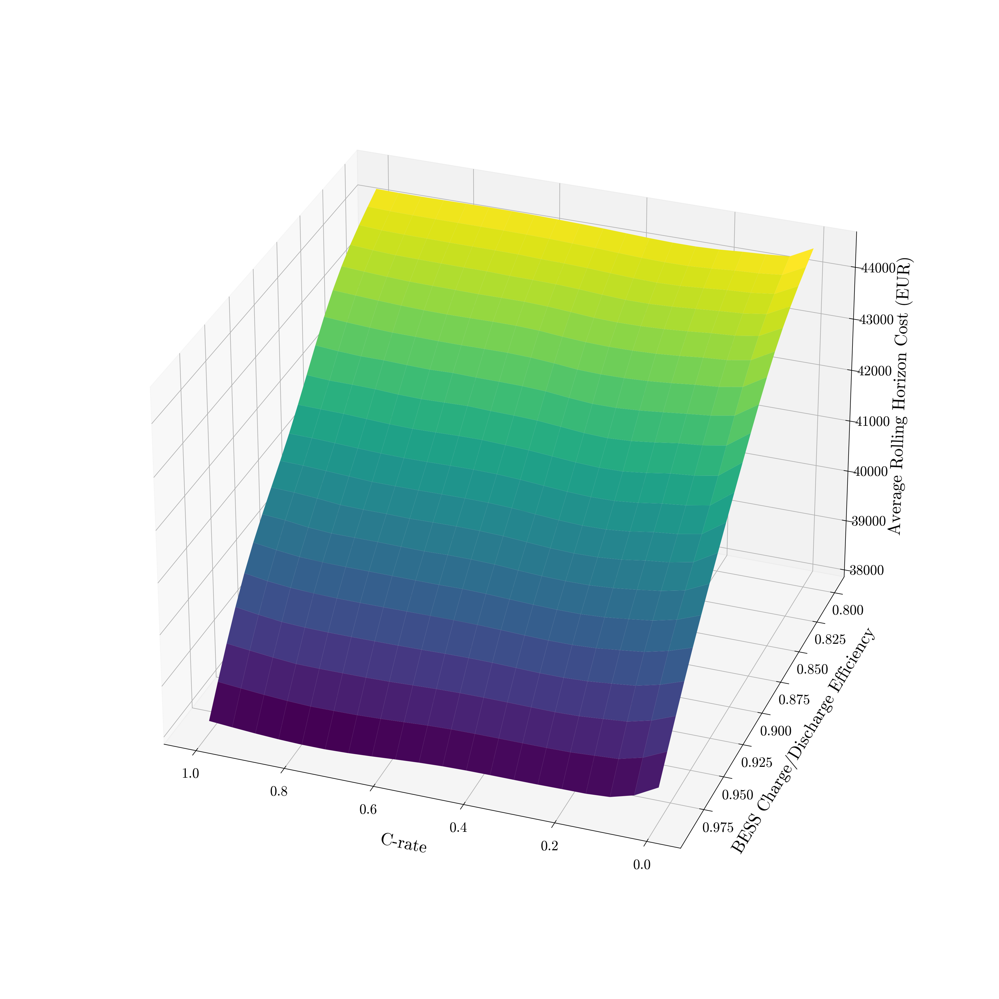

In [125]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


emgs = []
etas = []
costs = []
det_costs = []

# Extract data and compute averages
for emg, eta_dict in scenario_dict5.items():
    print(crate)
    for eta, (cost_list, _) in eta_dict.items():
        emgs.append(emg)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list
        
        
# Extract data and compute averages
for crate, eta_dict in scenario_dict4_optimal.items():
    for eta,det_cost in eta_dict.items():
        #print(det_cost)
        
        det_costs.append(det_cost)

costs = np.array(costs)
det_costs = np.array(det_costs)
optimality = (abs(det_costs-costs)/det_costs)*100

# Create grid coordinates for plotting
horizon_grid = np.linspace(min(emgs), max(emgs), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((emgs, etas), costs, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_emg_eta_2mo.png', bbox_inches='tight')

plt.show()

In [127]:
optimality

array([ 7.76848763,  9.66523922, 12.93088989, 16.65739893, 20.18274839,
        2.84908999,  3.99884076,  6.56663854,  8.80542585, 11.63053141,
        0.69444008,  0.10938409,  1.56529622,  2.71491348,  4.59463299,
        4.69084064,  4.44081417,  3.2023848 ,  2.77014524,  1.76822035,
        5.99382287,  5.81771828,  4.88107415,  4.80801473,  4.18229057,
        6.07987892,  5.88284718,  4.89782881,  4.84767629,  3.94812785,
        6.07129928,  6.10176674,  5.07341182,  5.24470613,  4.23751459])

2
2
2
2
2
2
2


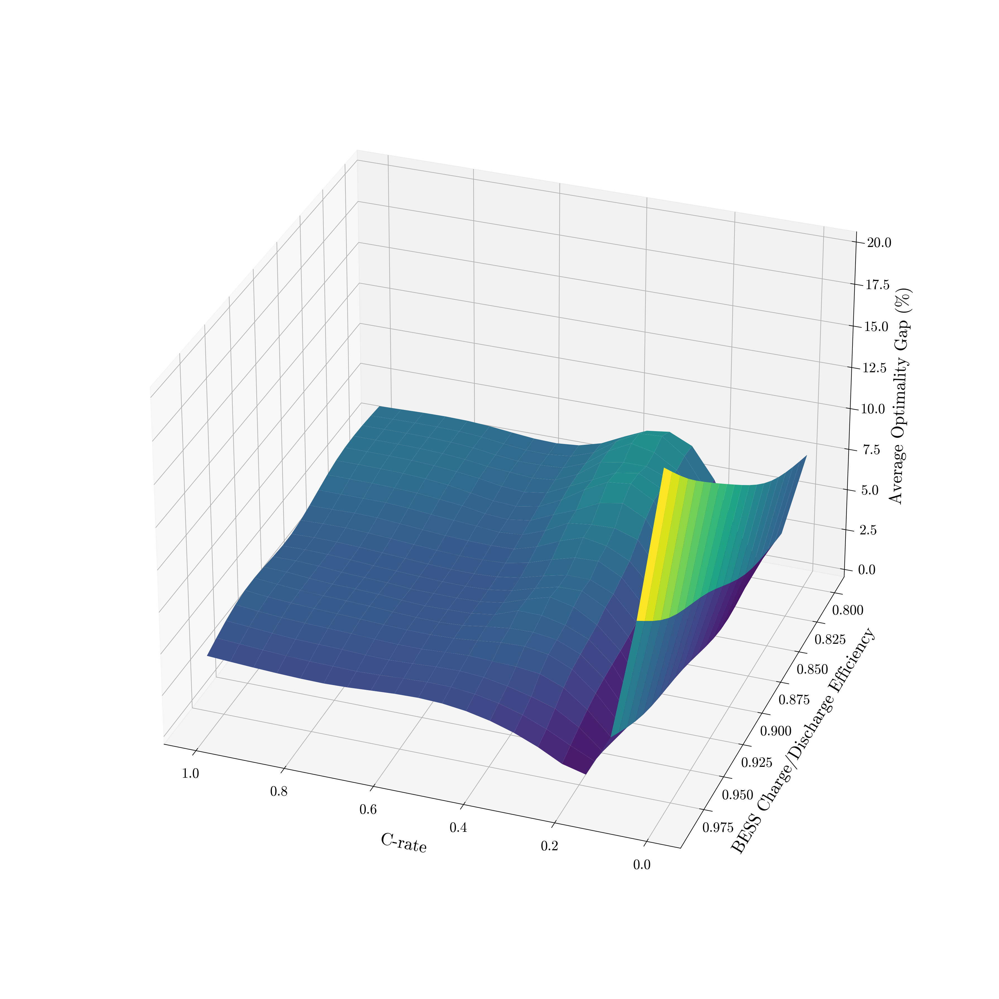

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


emgs = []
etas = []
costs = []
det_costs = []

# Extract data and compute averages
for emg, eta_dict in scenario_dict5.items():
    print(crate)
    for eta, (cost_list, _) in eta_dict.items():
        emgs.append(emg)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list
        
        
# Extract data and compute averages
for crate, eta_dict in scenario_dict4_optimal.items():
    for eta,det_cost in eta_dict.items():
        #print(det_cost)
        
        det_costs.append(det_cost)

costs = np.array(costs)
det_costs = np.array(det_costs)
optimality = (abs(det_costs-costs)/det_costs)*100

# Create grid coordinates for plotting
horizon_grid = np.linspace(min(emgs), max(emgs), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((emgs, etas), optimality, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('BESS Charge/Discharge Efficiency',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_emg_eta_2mo_optimality.png', bbox_inches='tight')

plt.show()

# Horizon and EMG

In [89]:
horizon_list = [2,4,6,8,10,12]
emg_list = [0,0.1,0.3,0.5,0.6,0.8,0.9,1]

scenario_dict6 = {}

Sn = 5
for horizon in horizon_list:
    scenario_dict6[horizon] = {}
    for emg in emg_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = horizon # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = 1 # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = eta # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []
        for iter in range(Sn+1):
            print(f"iter {iter}")
            # Simulation loop
            # Initialize simulation variables
            total_rolling_horizon_cost = 0
            print(iter)
            rolling_horizon_costs = []
            # Data initialization
            price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
            # Convert arrays to float to avoid typecasting issues later
            demand_set = demand_list.astype(float)
            PV_generation_set = PV_list.astype(float)

            # Initialize State of Charge (SOC)
            max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
            current_SOC = max_capacity*0.1
            start_time = 0
            for hour in range(SIMULATION_DURATION):

                SEED = int( (hour + iter)*math.pi) # Seed for random number generator
                # Initialize random seed


                horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)


                demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
                PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]


                if iter > 0:
                    np.random.seed(SEED)
                    demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                    demand_subset = np.clip(demand_subset, 0, None)
                    PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                    PV_generation_subset = np.clip(PV_generation_subset, 0, None)


                price_subset = price_set[start_time+hour:start_time+horizon_end]

                try:
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                    )

                    current_SOC = updated_SOC[0]  # Update SOC for the next iteration

                except Exception as e:
                    print(current_SOC)
                    print(hour)
                    print(iter)
                    print(PV_generation_subset)
                    print(demand_subset)
                    print(price_subset)
                    print(f"Optimization failed at hour {hour}: {e}")
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                    )




                # Update costs and SOC for the next iteration
                rolling_horizon_costs.append(current_cost)
                total_rolling_horizon_cost += current_cost

            #print(total_rolling_horizon_cost)
            average_rolling_horizon_cost.append(total_rolling_horizon_cost)



        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==2:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict6[horizon][emg] = (average_rolling_horizon_cost,total_cost_det)
    
  

# File path where the dictionary will be stored
file_path = 'emg_hl_errors_2mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict6, file)

print(f"Dictionary has been saved to {file_path}")


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[44869.7878342392, 44815.587672530666, 44898.86308686075, 44896.61117470199, 44872.13294399065, 44879.056170777694]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[44744.03619859326, 44742.049657258365, 44705.42037903474, 44767.052080746726, 44809.3960737686, 44703.443665135645]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[44582.70197773458, 44633.61689858953, 44595.09548850677, 44606.89495013448, 44515.93093447918, 44894.715660148766]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[44655.016797685465, 44641.44197381079, 44550.935332644265, 44641.50138496341, 44510.68367758097, 44622.49737991783]
Initial SOC: [0.036  0.081  0.4275]
Ma

In [130]:
scenario_dict6

{2: {0: ([44869.7878342392,
    44815.587672530666,
    44898.86308686075,
    44896.61117470199,
    44872.13294399065,
    44879.056170777694],
   36841.31105759642),
  0.1: ([44744.03619859326,
    44742.049657258365,
    44705.42037903474,
    44767.052080746726,
    44809.3960737686,
    44703.443665135645],
   36554.36145512634),
  0.3: ([44582.70197773458,
    44633.61689858953,
    44595.09548850677,
    44606.89495013448,
    44515.93093447918,
    44894.715660148766],
   36550.33536742735),
  0.5: ([44655.016797685465,
    44641.44197381079,
    44550.935332644265,
    44641.50138496341,
    44510.68367758097,
    44622.49737991783],
   36550.33536742738),
  0.6: ([44584.0422567051,
    44462.754246811426,
    44503.45675018666,
    44619.66954603085,
    44454.36584705892,
    44400.93161828212],
   36550.3353674273),
  0.8: ([44534.09569996905,
    44561.4565901804,
    44630.45346266169,
    44429.67716582582,
    44565.91330480489,
    44358.41104389687],
   36550.3353674

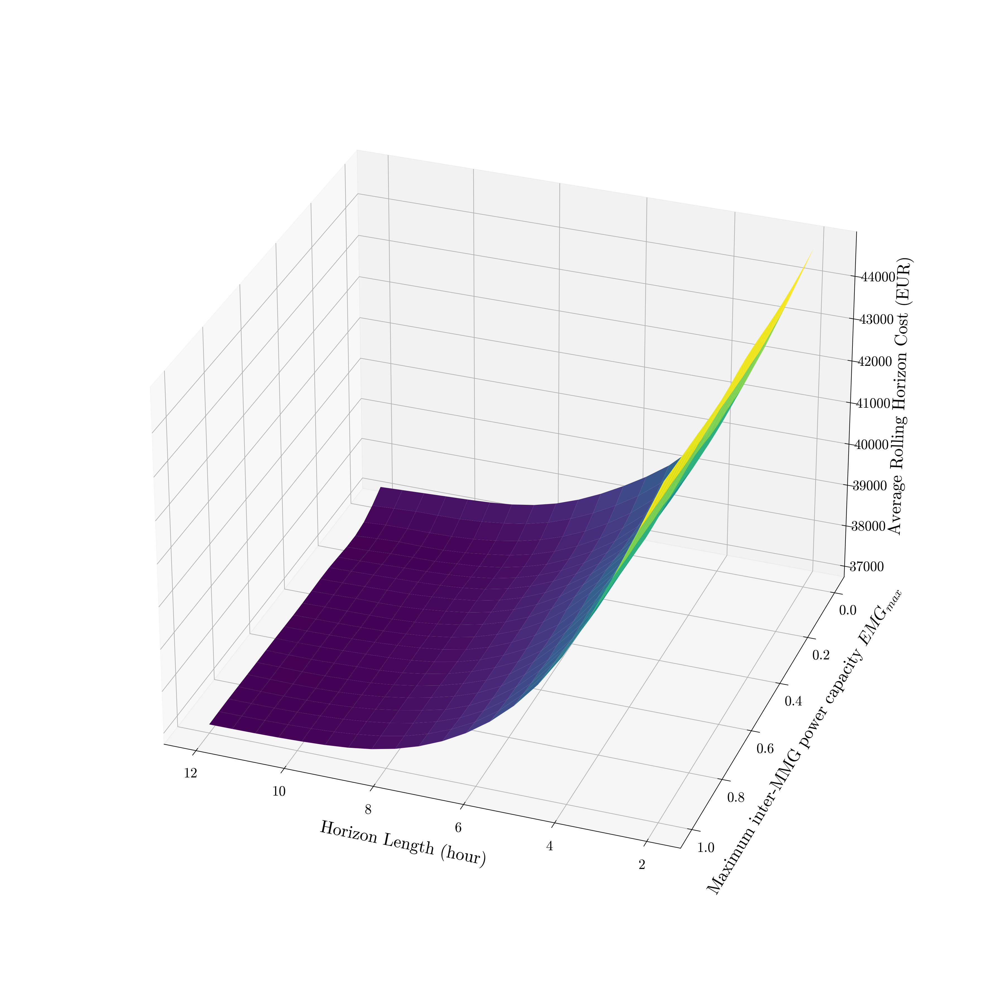

In [131]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


horizons = []
etas = []
costs = []
optimality = []

# Extract data and compute averages
for horizon, eta_dict in scenario_dict6.items():
    for eta, (cost_list, det_cost) in eta_dict.items():
        horizons.append(horizon)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list
        optimality.append((abs(det_cost - np.mean(cost_list))/det_cost)*100)

# Create grid coordinates for plotting
horizon_grid = np.linspace(min(horizons), max(horizons), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), costs, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('Maximum inter-MMG power capacity $EMG_{max}$',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_hl_emg_2mo.png', bbox_inches='tight')

plt.show()

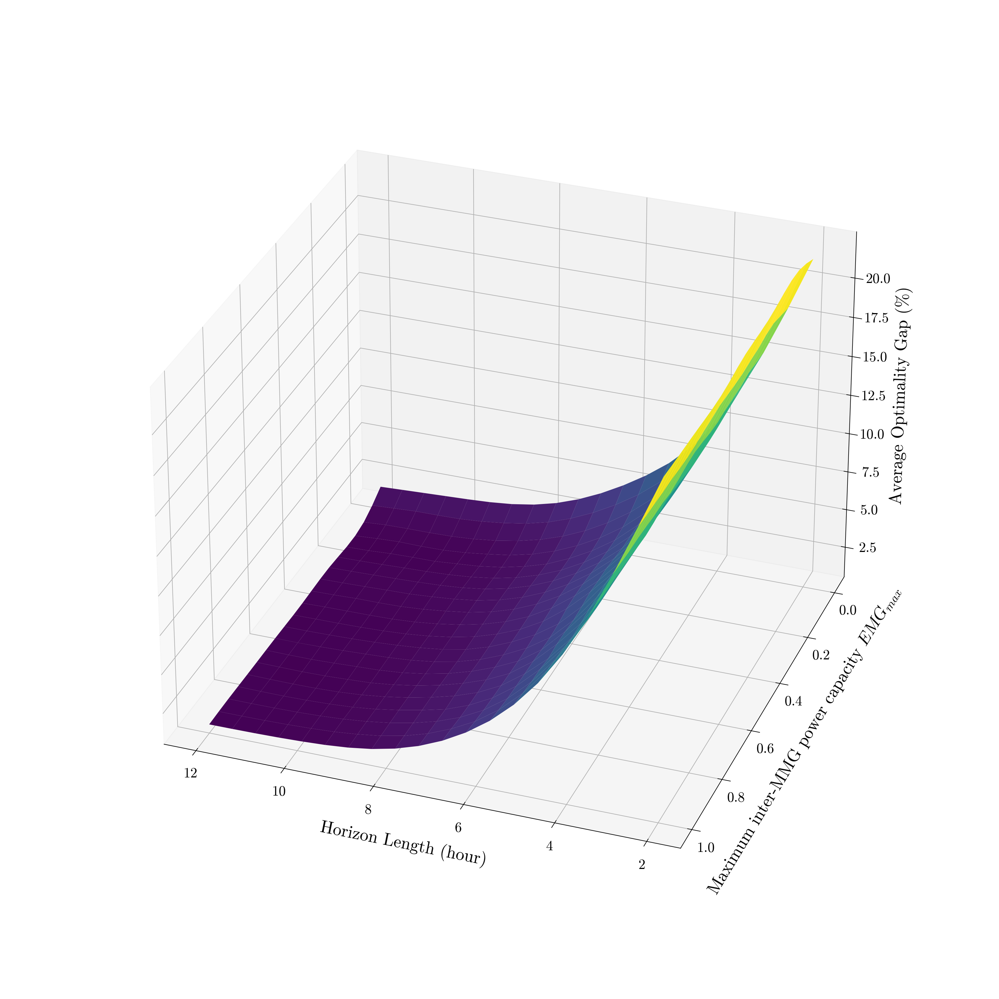

In [133]:
# Create grid coordinates for plotting
horizon_grid = np.linspace(min(horizons), max(horizons), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), optimality, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('Horizon Length (hour)', fontsize=22 ,labelpad=30)
ax.set_ylabel('Maximum inter-MMG power capacity $EMG_{max}$',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_hl_emg_2mo_optim.png', bbox_inches='tight')

plt.show()

# crate and emg

In [90]:
crate_list = [0,0.1,0.2,0.3,0.5,0.8,1,1.5]
emg_list = [0,0.1,0.3,0.5,0.6,0.8,0.9,1]

scenario_dict7 = {}

Sn = 5
for crate in crate_list:
    scenario_dict7[crate] = {}
    for emg in emg_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 6 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = crate # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = 0.95 # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []
        for iter in range(Sn+1):
            print(f"iter {iter}")
            # Simulation loop
            # Initialize simulation variables
            total_rolling_horizon_cost = 0
            print(iter)
            rolling_horizon_costs = []
            # Data initialization
            price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
            # Convert arrays to float to avoid typecasting issues later
            demand_set = demand_list.astype(float)
            PV_generation_set = PV_list.astype(float)

            # Initialize State of Charge (SOC)
            max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
            current_SOC = max_capacity*0.1
            start_time = 0
            for hour in range(SIMULATION_DURATION):

                SEED = int( (hour + iter)*math.pi) # Seed for random number generator
                # Initialize random seed


                horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)


                demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
                PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]


                if iter > 0:
                    np.random.seed(SEED)
                    demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                    demand_subset = np.clip(demand_subset, 0, None)
                    PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                    PV_generation_subset = np.clip(PV_generation_subset, 0, None)


                price_subset = price_set[start_time+hour:start_time+horizon_end]

                try:
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                    )

                    current_SOC = updated_SOC[0]  # Update SOC for the next iteration

                except Exception as e:
                    print(current_SOC)
                    print(hour)
                    print(iter)
                    print(PV_generation_subset)
                    print(demand_subset)
                    print(price_subset)
                    print(f"Optimization failed at hour {hour}: {e}")
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                    )




                # Update costs and SOC for the next iteration
                rolling_horizon_costs.append(current_cost)
                total_rolling_horizon_cost += current_cost

            #print(total_rolling_horizon_cost)
            average_rolling_horizon_cost.append(total_rolling_horizon_cost)



        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==2:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict7[crate][emg] = (average_rolling_horizon_cost,total_cost_det)
    
  

# File path where the dictionary will be stored
file_path = 'emg_crate_errors_2mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict7, file)

print(f"Dictionary has been saved to {file_path}")


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48478.6478315046, 48478.6478315046, 48478.6478315046, 48478.6478315046, 48478.6478315046, 48478.6478315046]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.548875224384, 48294.548875224384, 48294.548875224384, 48294.54887522439, 48294.548875224384, 48294.548875224384]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.47402862438, 48294.47402862438, 48294.47402862439, 48294.47402862438, 48294.47402862438, 48294.47402862438]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438, 48294.47402862438]
Initial SOC: [0.036  0.081  0.4275]
Max capac

In [137]:
crate_list = [0,0.1,0.2,0.3,0.5,0.8,1,1.5]
emg_list = [0,0.1,0.3,0.5,0.6,0.8,0.9,1]

scenario_dict7_optimality = {}

Sn = 5
for crate in crate_list:
    scenario_dict7_optimality[crate] = {}
    for emg in emg_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*2
        HORIZON_LENGTH = 6 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = crate # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = 0.95 # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []


        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==2:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict7_optimality[crate][emg] = total_cost_det
    
  

# File path where the dictionary will be stored
file_path = 'emg_crate_errors_2mo_optimality.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict7_optimality, file)

print(f"Dictionary has been saved to {file_path}")


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
[]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [

In [162]:
# File path from where the dictionary will be loaded
file_path = 'emg_crate_errors_2mo.pkl'

# Loading the dictionary from the file
with open(file_path, 'rb') as file:
    scenario_dict7 = pickle.load(file)

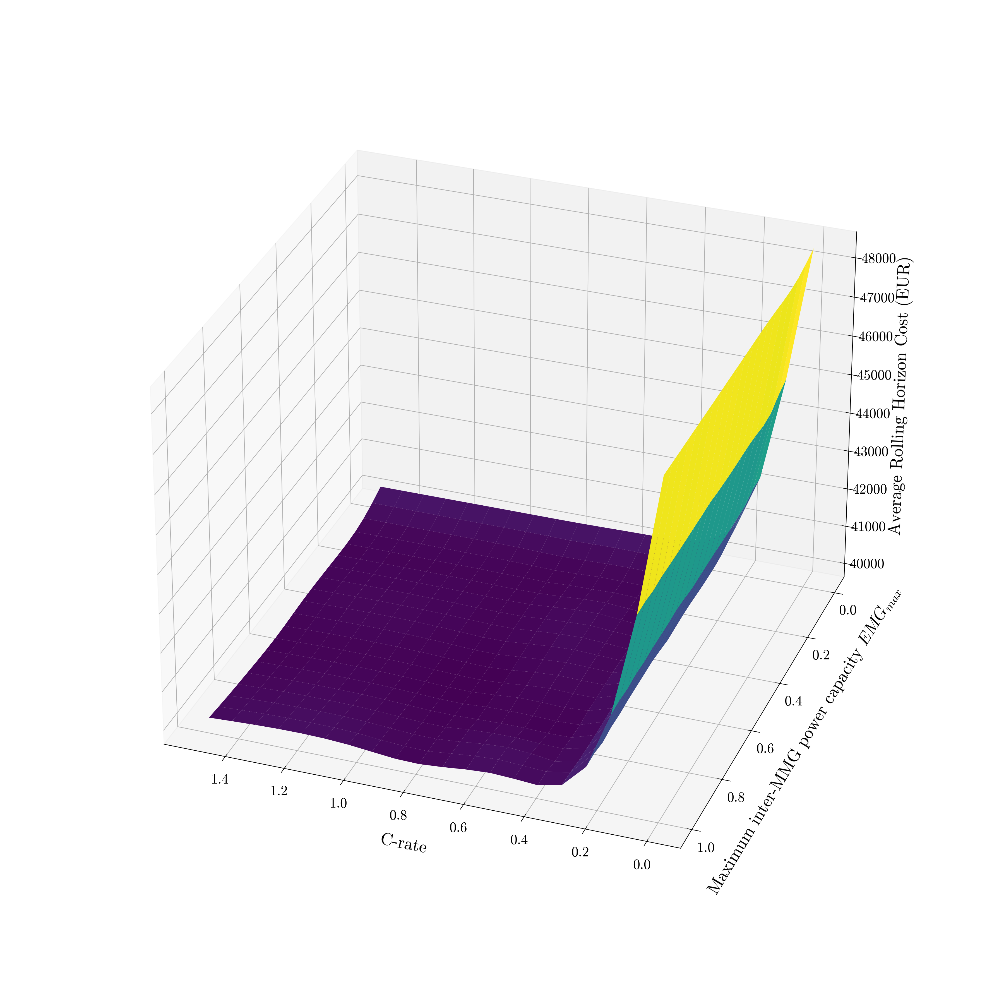

In [164]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


horizons = []
etas = []
costs = []
optim_costs = []

# Extract data and compute averages
for horizon, eta_dict in scenario_dict7_optimality.items():
    for eta, det_cost in eta_dict.items():
        optim_costs.append(det_cost)
        



# Extract data and compute averages
for horizon, eta_dict in scenario_dict7.items():
    for eta, (cost_list, _) in eta_dict.items():
        horizons.append(horizon)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list

costs = np.array(costs)
optim_costs = np.array(optim_costs)

optimality = (abs(optim_costs-costs)/optim_costs)*100
# Create grid coordinates for plotting
horizon_grid = np.linspace(min(horizons), max(horizons), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), costs, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('Maximum inter-MMG power capacity $EMG_{max}$',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Rolling Horizon Cost (EUR)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_crate_emg_2mo.png', bbox_inches='tight')

plt.show()

In [154]:
scenario_dict7

{}

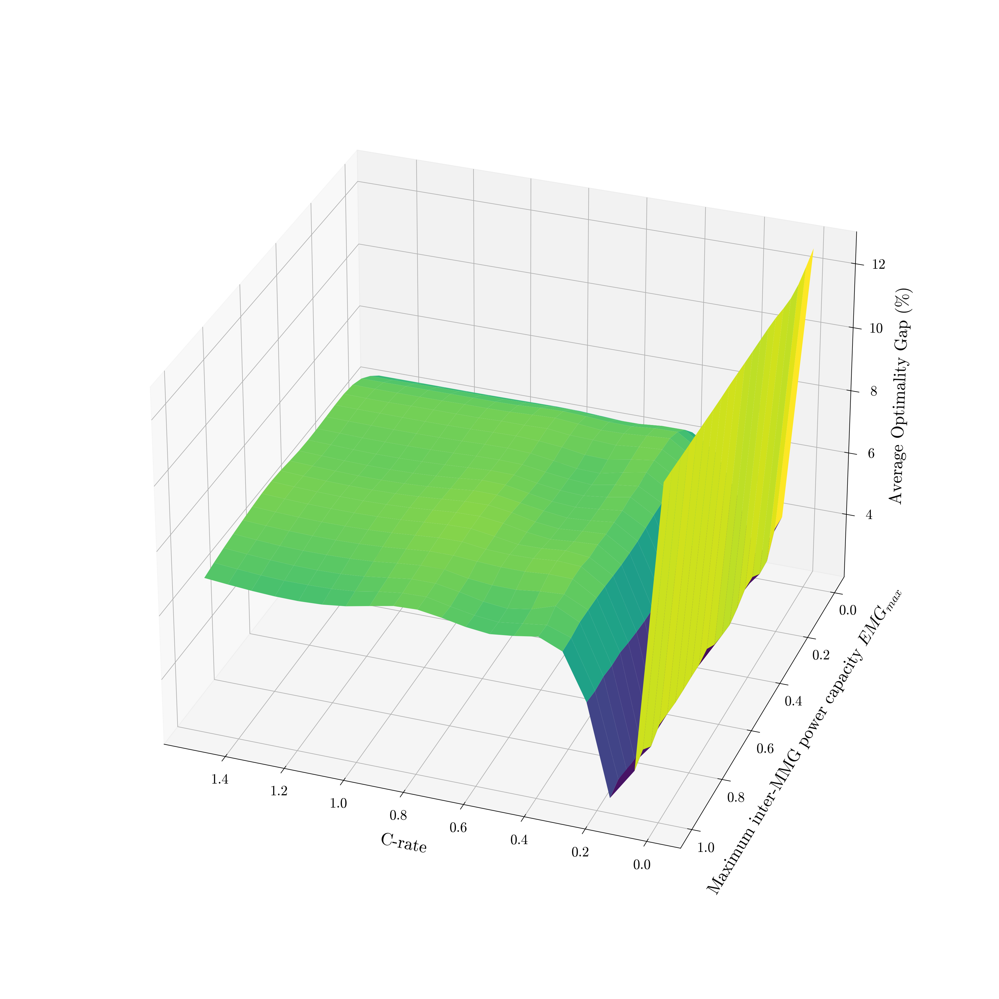

In [165]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


horizons = []
etas = []
costs = []
optim_costs = []

# Extract data and compute averages
for horizon, eta_dict in scenario_dict7_optimality.items():
    for eta, det_cost in eta_dict.items():
        optim_costs.append(det_cost)
        



# Extract data and compute averages
for horizon, eta_dict in scenario_dict7.items():
    for eta, (cost_list, _) in eta_dict.items():
        horizons.append(horizon)
        etas.append(eta)
        costs.append(np.mean(cost_list))  # Compute average of cost_list

costs = np.array(costs)
optim_costs = np.array(optim_costs)

optimality = (abs(optim_costs-costs)/optim_costs)*100
# Create grid coordinates for plotting
horizon_grid = np.linspace(min(horizons), max(horizons), 20)
eta_grid = np.linspace(min(etas), max(etas), 20)
horizon_mesh, eta_mesh = np.meshgrid(horizon_grid, eta_grid)

# Interpolate costs
cost_mesh = griddata((horizons, etas), optimality, (horizon_mesh, eta_mesh), method='cubic')

# Create the plot
fig = plt.figure(figsize=(24,18), dpi=200)
ax = fig.add_subplot(111, projection='3d')
fig.tight_layout()

# Surface plot
surface = ax.plot_surface(horizon_mesh, eta_mesh, cost_mesh, cmap='viridis', edgecolor='none')
plt.tick_params(axis='both', which='major', labelsize=18)  # Increase tick label size
ax.tick_params(axis='x', pad=10)  # Adds padding to the x-axis tick labels
ax.tick_params(axis='y', pad=10)  # Adds padding to the y-axis tick labels
ax.tick_params(axis='z', pad=15)  # Adds padding to the z-axis tick labels
ax.set_box_aspect(None, zoom=0.85)
# Adding labels
ax.set_xlabel('C-rate', fontsize=22 ,labelpad=30)
ax.set_ylabel('Maximum inter-MMG power capacity $EMG_{max}$',  labelpad=30,fontsize=22)
ax.set_zlabel('Average Optimality Gap (%)', fontsize=22, labelpad=30)
ax.view_init(elev=30, azim=110) 

# Show the plot
fig.savefig('errors_crate_emg_2mo_og.png', bbox_inches='tight')

plt.show()

In [110]:
scenario_dict6[8]

{0: ([37313.05065298301,
   37619.184967890855,
   37661.47989232139,
   37643.33652414218,
   37823.34677168776,
   37668.376530310314],
  36550.335367427375),
 0.1: ([36992.73830259791,
   37303.63400879519,
   37269.95954456183,
   37330.95564086102,
   37517.609687265365,
   37334.56082954039],
  36550.335367427375),
 0.3: ([36976.784663062106,
   37219.3150350866,
   37219.52983612285,
   37246.34368841649,
   37410.76311541569,
   37194.6041507357],
  36550.335367427375),
 0.5: ([36980.83618867397,
   37150.58148773299,
   37215.53094970956,
   37248.46466323006,
   37374.749763542284,
   37246.167810884835],
  36550.335367427375),
 0.6: ([36971.5437036611,
   37151.51762152265,
   37186.104862545224,
   37224.621257694496,
   37320.32181924248,
   37238.15788386864],
  36550.335367427375),
 0.8: ([36968.67239727058,
   37203.59762857849,
   37251.66924807189,
   37230.07228880226,
   37370.617661681725,
   37272.30894010963],
  36550.335367427375),
 0.9: ([36968.67239727058,
   

In [107]:
(39819.69220638039-39914.37631426055)/39819.69220638039

-0.002377821189310822

In [136]:
crate_list = [1]
emg_list = [0,1]

scenario_dict8 = {}

Sn = 5
for crate in crate_list:
    scenario_dict8[crate] = {}
    for emg in emg_list:
        # Constants
        NUM_CONSUMERS = 3
        SIMULATION_DURATION = 24*30*12
        HORIZON_LENGTH = 12 # Planning horizon length in hours
        INTER_MICROGRID_LIMIT = emg  # Inter-microgrid trading limit
        PRICE_SPREAD = 0.05  # Price spread for trades
        CHARGING_LIMIT = crate # Battery charging limit
        TRADE_COST_ENABLED = True  # Flag for enabling trade costs
        UNCERTAINTY_SIGMA = 0.0  # Price/Demand/PV uncertainty
        CHARGING_EFFICIENCY = 0.95 # Charging efficiency
        eta=CHARGING_EFFICIENCY

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Uncomment the next line if you want to replace negative prices with 5 EUR/MWh
        # price_set = np.where(price_set < 0, 5, price_set)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print("Initial SOC:", current_SOC)
        print("Max capacity:", max_capacity)
        


        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)
        start_time = 0
        average_rolling_horizon_cost = []
        for iter in range(Sn+1):
            print(f"iter {iter}")
            # Simulation loop
            # Initialize simulation variables
            total_rolling_horizon_cost = 0
            print(iter)
            rolling_horizon_costs = []
            # Data initialization
            price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
            # Convert arrays to float to avoid typecasting issues later
            demand_set = demand_list.astype(float)
            PV_generation_set = PV_list.astype(float)

            # Initialize State of Charge (SOC)
            max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
            current_SOC = max_capacity*0.1
            start_time = 0
            for hour in range(SIMULATION_DURATION):

                SEED = int( (hour + iter)*math.pi) # Seed for random number generator
                # Initialize random seed


                horizon_end = min(hour + HORIZON_LENGTH, SIMULATION_DURATION)


                demand_subset = demand_set[:, start_time+hour:start_time+horizon_end]
                PV_generation_subset = PV_generation_set[:, start_time+hour:start_time+horizon_end]


                if iter > 0:
                    np.random.seed(SEED)
                    demand_subset = np.array([add_load_errors(demand_subset[i,:]) for i in range(num_consumers)])
                    demand_subset = np.clip(demand_subset, 0, None)
                    PV_generation_subset = np.array([add_solar_errors(PV_generation_subset[i,:]) for i in range(num_consumers)])
                    PV_generation_subset = np.clip(PV_generation_subset, 0, None)


                price_subset = price_set[start_time+hour:start_time+horizon_end]

                try:
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=0
                    )

                    current_SOC = updated_SOC[0]  # Update SOC for the next iteration

                except Exception as e:
                    print(current_SOC)
                    print(hour)
                    print(iter)
                    print(PV_generation_subset)
                    print(demand_subset)
                    print(price_subset)
                    print(f"Optimization failed at hour {hour}: {e}")
                    total_sold, total_cost, total_battery_usage, current_cost, updated_SOC, cost_list, model = det_optimisation(
                        INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                        demand_subset, PV_generation_subset, price_subset, horizon_end - hour, current_SOC, max_capacity, outputflag=1
                    )




                # Update costs and SOC for the next iteration
                rolling_horizon_costs.append(current_cost)
                total_rolling_horizon_cost += current_cost

            #print(total_rolling_horizon_cost)
            average_rolling_horizon_cost.append(total_rolling_horizon_cost)



        #total_rolling_horizon_cost = np.mean(average_rolling_horizon_cost)

        # Data initialization
        price_set = np.array(df_prices["Day-ahead Price [EUR/MWh]"].astype(float))
        # Convert arrays to float to avoid typecasting issues later
        demand_set = demand_list.astype(float)
        PV_generation_set = PV_list.astype(float)

        # Initialize State of Charge (SOC)
        max_capacity = np.array([PVavg[i + 1] * number_of_homes[i] * 1e-3 * 1.5 for i in range(NUM_CONSUMERS)])
        current_SOC = max_capacity*0.1

        print(average_rolling_horizon_cost)
        if horizon ==12:
            # Final aggregation and analysis
            final_demand_subset = demand_set[:, :SIMULATION_DURATION]
            final_PV_generation_subset = PV_generation_set[:, :SIMULATION_DURATION]
            final_price_subset = price_set[:SIMULATION_DURATION]

            total_sold, total_cost_det, total_battery_usage, final_cost, final_SOC, cost_list, model = det_optimisation(
                INTER_MICROGRID_LIMIT, PRICE_SPREAD, CHARGING_LIMIT, TRADE_COST_ENABLED,
                final_demand_subset, final_PV_generation_subset, final_price_subset, SIMULATION_DURATION, current_SOC, max_capacity, outputflag=0
            )




            total_deterministic_costs = [sum(sublist) for sublist in cost_list]

        scenario_dict8[crate][emg] = (average_rolling_horizon_cost,total_cost_det)
    
  

# File path where the dictionary will be stored
file_path = 'emg_crate_errors_2mo.pkl'

# Saving the dictionary to a file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(scenario_dict7, file)

print(f"Dictionary has been saved to {file_path}")


Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[46328.98083165554, 48336.75319633693, 48308.400791221764, 48131.46362949611, 48326.259204652284, 48171.79506144504]
Initial SOC: [0.036  0.081  0.4275]
Max capacity: [0.36  0.81  4.275]
iter 0
0
iter 1
1
iter 2
2
iter 3
3
iter 4
4
iter 5
5
[44557.980863610544, 47004.31013338452, 46831.516710852906, 46515.893641675386, 47007.73495136806, 46861.60614600359]
Dictionary has been saved to emg_crate_errors_2mo.pkl


In [138]:
scenario_dict8

{1: {0: ([46328.98083165554,
    48336.75319633693,
    48308.400791221764,
    48131.46362949611,
    48326.259204652284,
    48171.79506144504],
   44647.71734060126),
  1: ([44557.980863610544,
    47004.31013338452,
    46831.516710852906,
    46515.893641675386,
    47007.73495136806,
    46861.60614600359],
   42989.319216235395)}}

In [144]:
np.mean([47004.31013338452,
    46831.516710852906,
    46515.893641675386,
    47007.73495136806,
    46861.60614600359])

46844.21231665689

In [166]:
abs(46515.893641675386- 48336.75 )/48336.75 

0.03767022727685693